<a href="https://colab.research.google.com/github/CodingYayaToure/-Fluide-WEBScrapping/blob/main/Yaya_Toure_Projet_Modelisation_Stat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd

# Charger les données à partir du fichier Excel
df = pd.read_excel("https://github.com/CodingYayaToure/Premier_projet/raw/main/Base_Projet_Introduction-Modelisation-2024.xls")

# Afficher les premières lignes et les informations sur le DataFrame
df.head()
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 804 entries, 0 to 803
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Prix         804 non-null    float64
 1   Km           804 non-null    int64  
 2   Marque       804 non-null    object 
 3   Modèle       804 non-null    object 
 4   Sous-modèle  804 non-null    object 
 5   Type         804 non-null    object 
 6   Cylindrée    804 non-null    int64  
 7   Litre        804 non-null    float64
 8   Portes       804 non-null    int64  
 9   Régulateur   804 non-null    int64  
 10  HP           804 non-null    int64  
 11  Cuir         804 non-null    int64  
dtypes: float64(2), int64(6), object(4)
memory usage: 75.5+ KB


In [3]:
# Vérifier les valeurs manquantes
missing_values = df.isnull().sum()
print("Valeurs manquantes par colonne :")
print(missing_values[missing_values > 0])  # Afficher uniquement les colonnes avec des valeurs manquantes

Valeurs manquantes par colonne :
Series([], dtype: int64)


In [4]:
# Vérifier les valeurs manquantes
df.isnull().sum()

Prix           0
Km             0
Marque         0
Modèle         0
Sous-modèle    0
Type           0
Cylindrée      0
Litre          0
Portes         0
Régulateur     0
HP             0
Cuir           0
dtype: int64

In [5]:
# Vérifier les doublons
duplicates = df.duplicated().sum()
print(f"Nombre de doublons dans le DataFrame : {duplicates}")


Nombre de doublons dans le DataFrame : 0


In [6]:
# Détection des valeurs aberrantes à l'aide de l'IQR
Q1 = df['Prix'].quantile(0.25)
Q3 = df['Prix'].quantile(0.75)
IQR = Q3 - Q1

# Définir les limites pour les valeurs aberrantes
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifier les valeurs aberrantes
outliers = df[(df['Prix'] < lower_bound) | (df['Prix'] > upper_bound)]
print("Valeurs aberrantes dans la colonne Prix :")
outliers


Valeurs aberrantes dans la colonne Prix :


,Prix,Km,Marque,Modèle,Sous-modèle,Type,Cylindrée,Litre,Portes,Régulateur,HP,Cuir
80,51154.047216,2202,Cadillac,CST-V,Sedan 4D,Sedan,8,5.7,4,1,1,1
81,49248.158967,6685,Cadillac,CST-V,Sedan 4D,Sedan,8,5.7,4,1,0,1
82,46747.673270,15343,Cadillac,CST-V,Sedan 4D,Sedan,8,5.7,4,1,1,1
140,48310.329545,788,Cadillac,STS-V8,Sedan 4D,Sedan,8,4.6,4,1,0,1
141,48365.980897,2616,Cadillac,STS-V8,Sedan 4D,Sedan,8,4.6,4,1,1,1
150,70755.466717,583,Cadillac,XLR-V8,Hardtop Conv 2D,Convertible,8,4.6,2,1,1,1
151,68566.187189,6420,Cadillac,XLR-V8,Hardtop Conv 2D,Convertible,8,4.6,2,1,1,1
152,69133.731722,7892,Cadillac,XLR-V8,Hardtop Conv 2D,Convertible,8,4.6,2,1,1,1
153,66374.307040,12021,Cadillac,XLR-V8,Hardtop Conv 2D,Convertible,8,4.6,2,1,1,1
154,65281.481237,15600,Cadillac,XLR-V8,Hardtop Conv 2D,Convertible,8,4.6,2,1,1,1


Étape 2 : Encodage des Variables Catégorielles
Pour encoder les colonnes Marque, Modèle, Sous-modèle et Type, vous pouvez utiliser l'encodage one-hot. Cela crée une nouvelle colonne pour chaque catégorie, avec des valeurs binaires (0 ou 1). **texte en gras**

In [132]:
# Appliquer l'encodage one-hot sur les colonnes catégorielles

df_encoded = pd.get_dummies(df, columns=['Marque', 'Modèle', 'Sous-modèle', 'Type'], drop_first=True)
df_final = pd.concat([df, df_encoded], axis=1)
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 804 entries, 0 to 803
Columns: 106 entries, Prix to Type_Wagon
dtypes: bool(86), float64(4), int64(12), object(4)
memory usage: 193.3+ KB


In [133]:
## Vérifier les colonnes présentes dans le DataFrame
print(df_encoded.columns)

# Supprimer les colonnes de type object si elles existent
columns_to_drop = ['Marque', 'Modèle', 'Sous-modèle', 'Type']
df_encoded = df_encoded.drop(columns=[col for col in columns_to_drop if col in df_encoded.columns])

# Vérifier les types de données après suppression
#print(df_encoded.info())
df_encoded.head()


Index(['Prix', 'Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP',
       'Cuir', 'Marque_Cadillac', 'Marque_Chevrolet', 'Marque_Pontiac',
       'Marque_SAAB', 'Marque_Saturn', 'Modèle_9_3', 'Modèle_9_3 HO',
       'Modèle_9_5', 'Modèle_9_5 HO', 'Modèle_AVEO', 'Modèle_Bonneville',
       'Modèle_CST-V', 'Modèle_CTS', 'Modèle_Cavalier', 'Modèle_Century',
       'Modèle_Classic', 'Modèle_Cobalt', 'Modèle_Corvette', 'Modèle_Deville',
       'Modèle_G6', 'Modèle_GTO', 'Modèle_Grand Am', 'Modèle_Grand Prix',
       'Modèle_Impala', 'Modèle_Ion', 'Modèle_L Series', 'Modèle_Lacrosse',
       'Modèle_Lesabre', 'Modèle_Malibu', 'Modèle_Monte Carlo',
       'Modèle_Park Avenue', 'Modèle_STS-V6', 'Modèle_STS-V8',
       'Modèle_Sunfire', 'Modèle_Vibe', 'Modèle_XLR-V8',
       'Sous-modèle_Aero Conv 2D', 'Sous-modèle_Aero Sedan 4D',
       'Sous-modèle_Aero Wagon 4D', 'Sous-modèle_Arc Conv 2D',
       'Sous-modèle_Arc Sedan 4D', 'Sous-modèle_Arc Wagon 4D',
       'Sous-modèle_CX Sedan 4D', 

,Prix,Km,Cylindrée,Litre,Portes,Régulateur,HP,Cuir,Marque_Cadillac,Marque_Chevrolet,Marque_Pontiac,Marque_SAAB,Marque_Saturn,Modèle_9_3,Modèle_9_3 HO,Modèle_9_5,Modèle_9_5 HO,Modèle_AVEO,Modèle_Bonneville,Modèle_CST-V,Modèle_CTS,Modèle_Cavalier,Modèle_Century,Modèle_Classic,Modèle_Cobalt,Modèle_Corvette,Modèle_Deville,Modèle_G6,Modèle_GTO,Modèle_Grand Am,Modèle_Grand Prix,Modèle_Impala,Modèle_Ion,Modèle_L Series,Modèle_Lacrosse,Modèle_Lesabre,Modèle_Malibu,Modèle_Monte Carlo,Modèle_Park Avenue,Modèle_STS-V6,Modèle_STS-V8,Modèle_Sunfire,Modèle_Vibe,Modèle_XLR-V8,Sous-modèle_Aero Conv 2D,Sous-modèle_Aero Sedan 4D,Sous-modèle_Aero Wagon 4D,Sous-modèle_Arc Conv 2D,Sous-modèle_Arc Sedan 4D,Sous-modèle_Arc Wagon 4D,Sous-modèle_CX Sedan 4D,Sous-modèle_CXL Sedan 4D,Sous-modèle_CXS Sedan 4D,Sous-modèle_Conv 2D,Sous-modèle_Coupe 2D,Sous-modèle_Custom Sedan 4D,Sous-modèle_DHS Sedan 4D,Sous-modèle_DTS Sedan 4D,Sous-modèle_GT Coupe 2D,Sous-modèle_GT Sedan 4D,Sous-modèle_GT Sportwagon,Sous-modèle_GTP Sedan 4D,Sous-modèle_GXP Sedan 4D,Sous-modèle_Hardtop Conv 2D,Sous-modèle_L300 Sedan 4D,Sous-modèle_LS Coupe 2D,Sous-modèle_LS Hatchback 4D,Sous-modèle_LS MAXX Hback 4D,Sous-modèle_LS Sedan 4D,Sous-modèle_LS Sport Coupe 2D,Sous-modèle_LS Sport Sedan 4D,Sous-modèle_LT Coupe 2D,Sous-modèle_LT Hatchback 4D,Sous-modèle_LT MAXX Hback 4D,Sous-modèle_LT Sedan 4D,Sous-modèle_Limited Sedan 4D,Sous-modèle_Linear Conv 2D,Sous-modèle_Linear Sedan 4D,Sous-modèle_Linear Wagon 4D,Sous-modèle_MAXX Hback 4D,Sous-modèle_Quad Coupe 2D,Sous-modèle_SE Sedan 4D,Sous-modèle_SLE Sedan 4D,Sous-modèle_SS Coupe 2D,Sous-modèle_SS Sedan 4D,Sous-modèle_SVM Hatchback 4D,Sous-modèle_SVM Sedan 4D,Sous-modèle_Sedan 4D,Sous-modèle_Special Ed Ultra 4D,Sous-modèle_Sportwagon 4D,Type_Coupe,Type_Hatchback,Type_Sedan,Type_Wagon
0,17314.103129,8221,6,3.1,4,1,1,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
1,17542.036083,9135,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
2,16218.847862,13196,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
3,16336.913140,16342,6,3.1,4,1,0,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
4,16339.

In [8]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.5/67.5 kB 561.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.4/431.4 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/255.9 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.4/155.4 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.7/24.7 MB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 80.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 81.3 MB/s eta 0:00:00
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.0.3
    Uninstalling xgboost-2.0.3:
      Successfully uninstalled xgboost-2.0.3
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
  Attempting uninstall: boke

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (804, 94)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  2
    Number of Integer-Categorical Columns =  2
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  86
    Number of Numeric-Boolean Columns =  4
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Prix,float64,0.000000,NA,8638.930895,70755.466717,Column has 17 outliers greater than upper bound (45383.68) or lower than lower bound(-4393.29). Cap them or remove them.
Km,int64,0.000000,98,266.000000,50387.000000,Column has 5 outliers greater than upper bound (41097.25) or lower than lower bound(-1260.75). Cap them or remove them.
Cylindrée,int64,0.000000,0,4.000000,8.000000,Column has a high correlation with ['Litre']. Consider dropping one of them.
Litre,float64,0.000000,NA,1.600000,6.000000,No issue
Portes,int64,0.000000,0,2.000000,4.000000,No issue
Régulateur,int64,0.000000,0,0.000000,1.000000,No issue
HP,int64,0.000000,0,0.000000,1.000000,No issue
Cuir,int64,0.000000,0,0.000000,1.000000,No issue
Marque_Cadillac,bool,0.000000,0,0.000000,1.000000,No issue
Marque_Chevrolet,bool,0.000000,0,0.000000,1.000000,No issue


Number of All Scatter Plots = 3


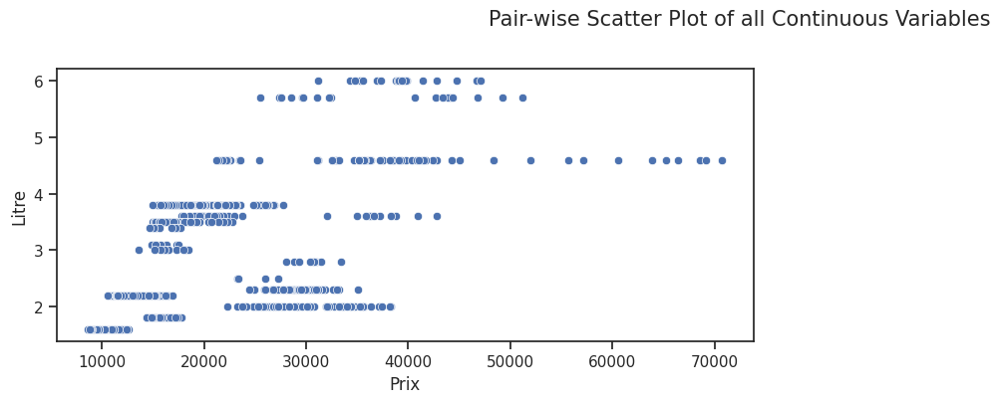

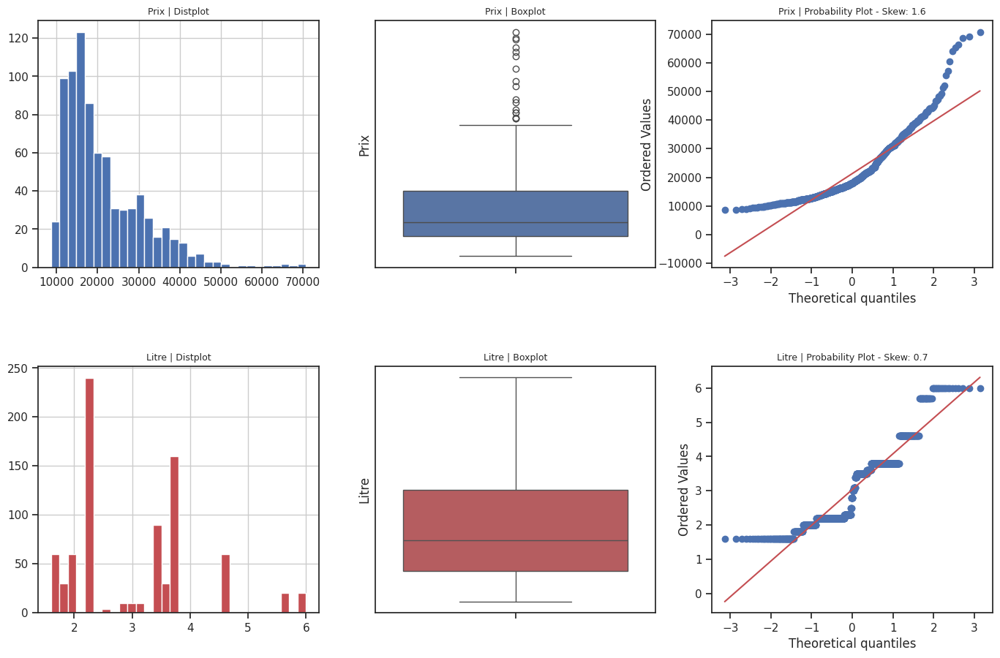

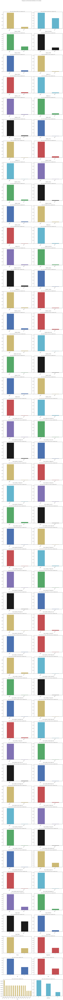

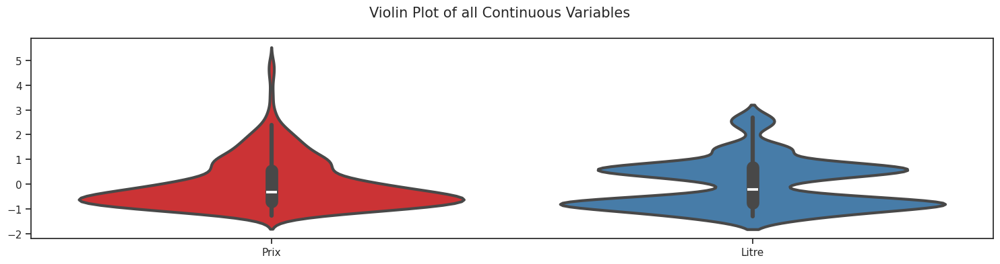

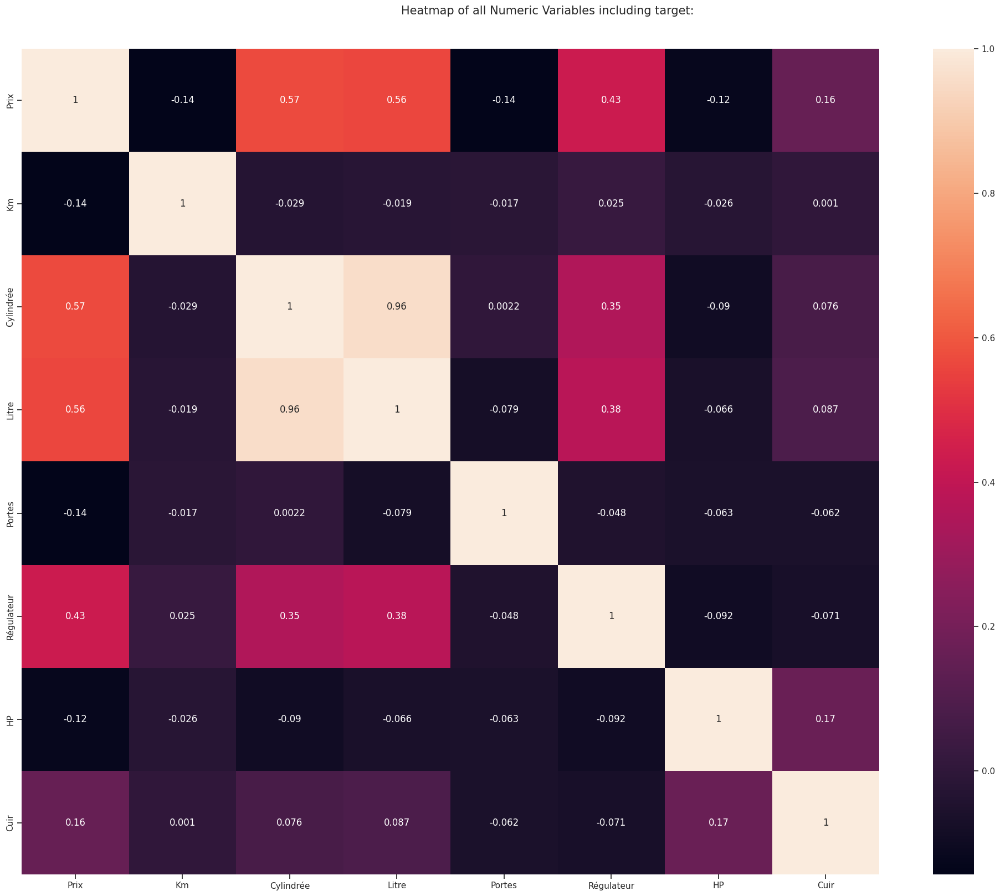

All Plots done
Time to run AutoViz = 76 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Prix,Km,Cylindrée,Litre,Portes,Régulateur,HP,Cuir,Marque_Cadillac,Marque_Chevrolet,Marque_Pontiac,Marque_SAAB,Marque_Saturn,Modèle_9_3,Modèle_9_3 HO,Modèle_9_5,Modèle_9_5 HO,Modèle_AVEO,Modèle_Bonneville,Modèle_CST-V,Modèle_CTS,Modèle_Cavalier,Modèle_Century,Modèle_Classic,Modèle_Cobalt,Modèle_Corvette,Modèle_Deville,Modèle_G6,Modèle_GTO,Modèle_Grand Am,Modèle_Grand Prix,Modèle_Impala,Modèle_Ion,Modèle_L Series,Modèle_Lacrosse,Modèle_Lesabre,Modèle_Malibu,Modèle_Monte Carlo,Modèle_Park Avenue,Modèle_STS-V6,Modèle_STS-V8,Modèle_Sunfire,Modèle_Vibe,Modèle_XLR-V8,Sous-modèle_Aero Conv 2D,Sous-modèle_Aero Sedan 4D,Sous-modèle_Aero Wagon 4D,Sous-modèle_Arc Conv 2D,Sous-modèle_Arc Sedan 4D,Sous-modèle_Arc Wagon 4D,Sous-modèle_CX Sedan 4D,Sous-modèle_CXL Sedan 4D,Sous-modèle_CXS Sedan 4D,Sous-modèle_Conv 2D,Sous-modèle_Coupe 2D,Sous-modèle_Custom Sedan 4D,Sous-modèle_DHS Sedan 4D,Sous-modèle_DTS Sedan 4D,Sous-modèle_GT Coupe 2D,Sous-modèle_GT Sedan 4D,Sous-modèle_GT Sportwagon,Sous-modèle_GTP Sedan 4D,Sous-modèle_GXP Sedan 4D,Sous-modèle_Hardtop Conv 2D,Sous-modèle_L300 Sedan 4D,Sous-modèle_LS Coupe 2D,Sous-modèle_LS Hatchback 4D,Sous-modèle_LS MAXX Hback 4D,Sous-modèle_LS Sedan 4D,Sous-modèle_LS Sport Coupe 2D,Sous-modèle_LS Sport Sedan 4D,Sous-modèle_LT Coupe 2D,Sous-modèle_LT Hatchback 4D,Sous-modèle_LT MAXX Hback 4D,Sous-modèle_LT Sedan 4D,Sous-modèle_Limited Sedan 4D,Sous-modèle_Linear Conv 2D,Sous-modèle_Linear Sedan 4D,Sous-modèle_Linear Wagon 4D,Sous-modèle_MAXX Hback 4D,Sous-modèle_Quad Coupe 2D,Sous-modèle_SE Sedan 4D,Sous-modèle_SLE Sedan 4D,Sous-modèle_SS Coupe 2D,Sous-modèle_SS Sedan 4D,Sous-modèle_SVM Hatchback 4D,Sous-modèle_SVM Sedan 4D,Sous-modèle_Sedan 4D,Sous-modèle_Special Ed Ultra 4D,Sous-modèle_Sportwagon 4D,Type_Coupe,Type_Hatchback,Type_Sedan,Type_Wagon
0,17314.103129,8221,6,3.1,4,1,1,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
1,17542.036083,9135,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
2,16218.847862,13196,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
3,16336.913140,16342,6,3.1,4,1,0,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
4,16339.

In [9]:
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
%matplotlib inline
AV = AutoViz_Class()
df_av = AV.AutoViz(df_encoded )
df_av

In [10]:
# Calculer les quartiles pour la colonne Prix
Q1 = df_encoded['Prix'].quantile(0.25)
Q3 = df_encoded['Prix'].quantile(0.75)
IQR = Q3 - Q1

# Définir les limites pour les valeurs aberrantes
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifier et supprimer les valeurs aberrantes
df_cleaned = df_encoded[(df_encoded['Prix'] >= lower_bound) & (df_encoded['Prix'] <= upper_bound)]

# Afficher le DataFrame nettoyé
df_cleaned


,Prix,Km,Cylindrée,Litre,Portes,Régulateur,HP,Cuir,Marque_Cadillac,Marque_Chevrolet,Marque_Pontiac,Marque_SAAB,Marque_Saturn,Modèle_9_3,Modèle_9_3 HO,Modèle_9_5,Modèle_9_5 HO,Modèle_AVEO,Modèle_Bonneville,Modèle_CST-V,Modèle_CTS,Modèle_Cavalier,Modèle_Century,Modèle_Classic,Modèle_Cobalt,Modèle_Corvette,Modèle_Deville,Modèle_G6,Modèle_GTO,Modèle_Grand Am,Modèle_Grand Prix,Modèle_Impala,Modèle_Ion,Modèle_L Series,Modèle_Lacrosse,Modèle_Lesabre,Modèle_Malibu,Modèle_Monte Carlo,Modèle_Park Avenue,Modèle_STS-V6,Modèle_STS-V8,Modèle_Sunfire,Modèle_Vibe,Modèle_XLR-V8,Sous-modèle_Aero Conv 2D,Sous-modèle_Aero Sedan 4D,Sous-modèle_Aero Wagon 4D,Sous-modèle_Arc Conv 2D,Sous-modèle_Arc Sedan 4D,Sous-modèle_Arc Wagon 4D,Sous-modèle_CX Sedan 4D,Sous-modèle_CXL Sedan 4D,Sous-modèle_CXS Sedan 4D,Sous-modèle_Conv 2D,Sous-modèle_Coupe 2D,Sous-modèle_Custom Sedan 4D,Sous-modèle_DHS Sedan 4D,Sous-modèle_DTS Sedan 4D,Sous-modèle_GT Coupe 2D,Sous-modèle_GT Sedan 4D,Sous-modèle_GT Sportwagon,Sous-modèle_GTP Sedan 4D,Sous-modèle_GXP Sedan 4D,Sous-modèle_Hardtop Conv 2D,Sous-modèle_L300 Sedan 4D,Sous-modèle_LS Coupe 2D,Sous-modèle_LS Hatchback 4D,Sous-modèle_LS MAXX Hback 4D,Sous-modèle_LS Sedan 4D,Sous-modèle_LS Sport Coupe 2D,Sous-modèle_LS Sport Sedan 4D,Sous-modèle_LT Coupe 2D,Sous-modèle_LT Hatchback 4D,Sous-modèle_LT MAXX Hback 4D,Sous-modèle_LT Sedan 4D,Sous-modèle_Limited Sedan 4D,Sous-modèle_Linear Conv 2D,Sous-modèle_Linear Sedan 4D,Sous-modèle_Linear Wagon 4D,Sous-modèle_MAXX Hback 4D,Sous-modèle_Quad Coupe 2D,Sous-modèle_SE Sedan 4D,Sous-modèle_SLE Sedan 4D,Sous-modèle_SS Coupe 2D,Sous-modèle_SS Sedan 4D,Sous-modèle_SVM Hatchback 4D,Sous-modèle_SVM Sedan 4D,Sous-modèle_Sedan 4D,Sous-modèle_Special Ed Ultra 4D,Sous-modèle_Sportwagon 4D,Type_Coupe,Type_Hatchback,Type_Sedan,Type_Wagon
0,17314.103129,8221,6,3.1,4,1,1,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
1,17542.036083,9135,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
2,16218.847862,13196,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
3,16336.913140,16342,6,3.1,4,1,0,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
4,16339.

Shape of your Data Set loaded: (787, 94)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  2
    Number of Integer-Categorical Columns =  2
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  84
    Number of Numeric-Boolean Columns =  4
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  2
    94 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Modèle_XLR-V8', 'Sous-modèle_Hardtop Conv 2D']
2 numeric variables

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Prix,float64,0.000000,NA,8638.930895,45061.951935,Column has 11 outliers greater than upper bound (42693.07) or lower than lower bound(-2877.44). Cap them or remove them.
Km,int64,0.000000,98,266.000000,50387.000000,Column has 4 outliers greater than upper bound (40721.75) or lower than lower bound(-624.25). Cap them or remove them.
Cylindrée,int64,0.000000,0,4.000000,8.000000,Column has a high correlation with ['Litre']. Consider dropping one of them.
Litre,float64,0.000000,NA,1.600000,6.000000,No issue
Portes,int64,0.000000,0,2.000000,4.000000,No issue
Régulateur,int64,0.000000,0,0.000000,1.000000,No issue
HP,int64,0.000000,0,0.000000,1.000000,No issue
Cuir,int64,0.000000,0,0.000000,1.000000,No issue
Marque_Cadillac,bool,0.000000,0,0.000000,1.000000,No issue
Marque_Chevrolet,bool,0.000000,0,0.000000,1.000000,No issue


Number of All Scatter Plots = 3


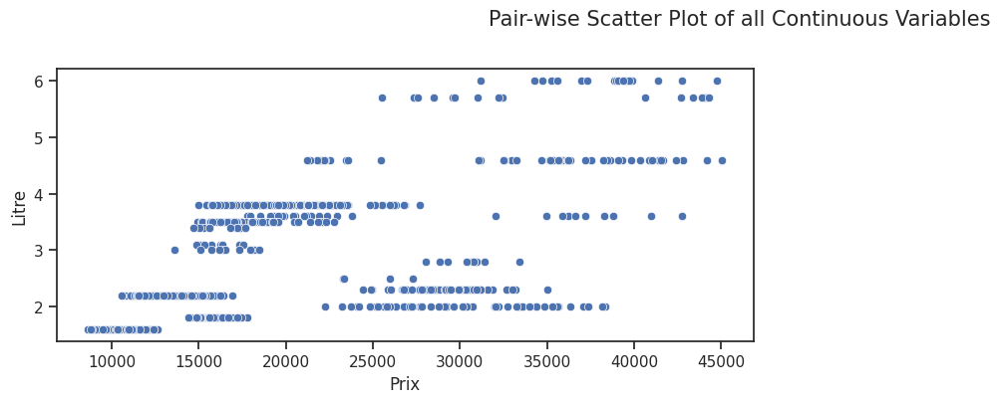

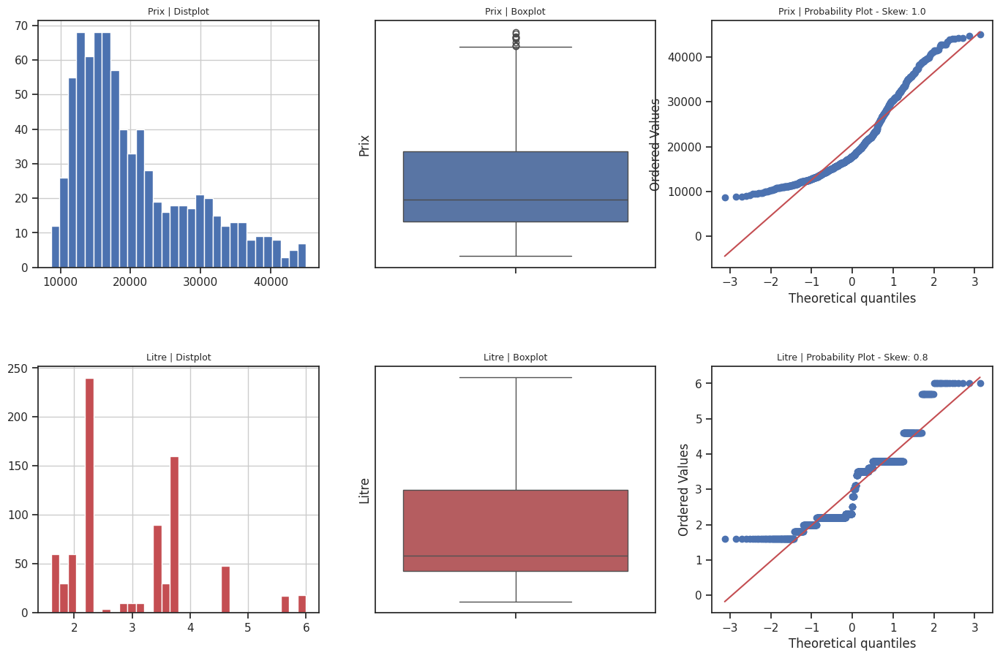

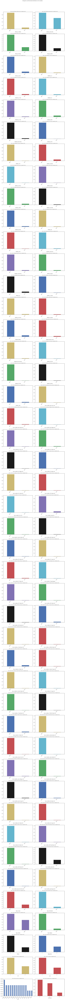

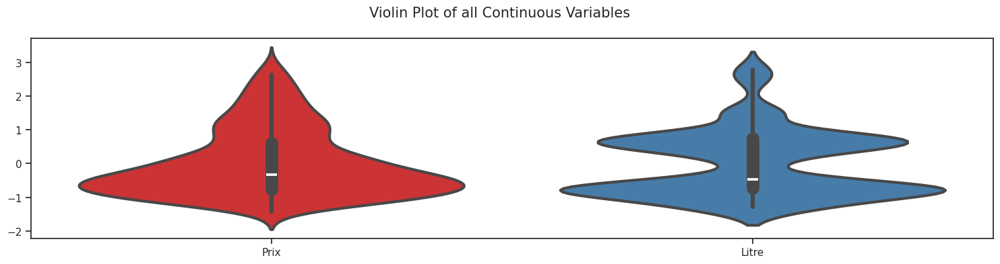

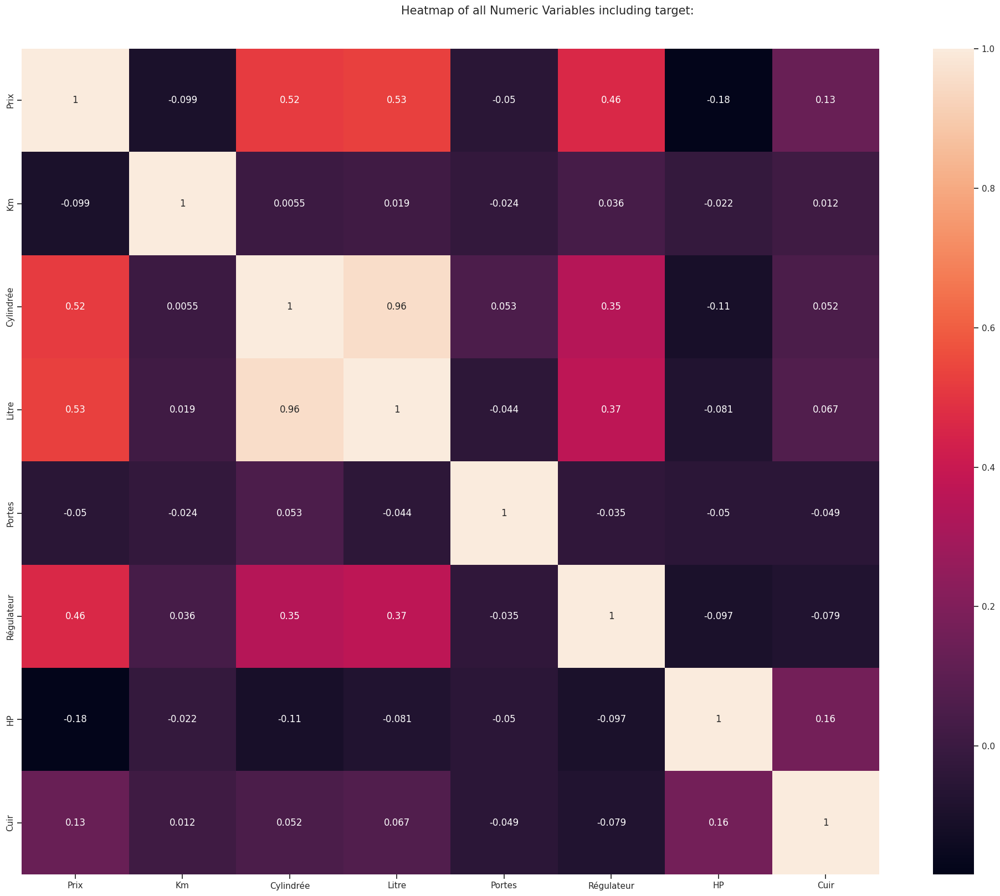

All Plots done
Time to run AutoViz = 82 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Prix,Km,Cylindrée,Litre,Portes,Régulateur,HP,Cuir,Marque_Cadillac,Marque_Chevrolet,Marque_Pontiac,Marque_SAAB,Marque_Saturn,Modèle_9_3,Modèle_9_3 HO,Modèle_9_5,Modèle_9_5 HO,Modèle_AVEO,Modèle_Bonneville,Modèle_CST-V,Modèle_CTS,Modèle_Cavalier,Modèle_Century,Modèle_Classic,Modèle_Cobalt,Modèle_Corvette,Modèle_Deville,Modèle_G6,Modèle_GTO,Modèle_Grand Am,Modèle_Grand Prix,Modèle_Impala,Modèle_Ion,Modèle_L Series,Modèle_Lacrosse,Modèle_Lesabre,Modèle_Malibu,Modèle_Monte Carlo,Modèle_Park Avenue,Modèle_STS-V6,Modèle_STS-V8,Modèle_Sunfire,Modèle_Vibe,Modèle_XLR-V8,Sous-modèle_Aero Conv 2D,Sous-modèle_Aero Sedan 4D,Sous-modèle_Aero Wagon 4D,Sous-modèle_Arc Conv 2D,Sous-modèle_Arc Sedan 4D,Sous-modèle_Arc Wagon 4D,Sous-modèle_CX Sedan 4D,Sous-modèle_CXL Sedan 4D,Sous-modèle_CXS Sedan 4D,Sous-modèle_Conv 2D,Sous-modèle_Coupe 2D,Sous-modèle_Custom Sedan 4D,Sous-modèle_DHS Sedan 4D,Sous-modèle_DTS Sedan 4D,Sous-modèle_GT Coupe 2D,Sous-modèle_GT Sedan 4D,Sous-modèle_GT Sportwagon,Sous-modèle_GTP Sedan 4D,Sous-modèle_GXP Sedan 4D,Sous-modèle_Hardtop Conv 2D,Sous-modèle_L300 Sedan 4D,Sous-modèle_LS Coupe 2D,Sous-modèle_LS Hatchback 4D,Sous-modèle_LS MAXX Hback 4D,Sous-modèle_LS Sedan 4D,Sous-modèle_LS Sport Coupe 2D,Sous-modèle_LS Sport Sedan 4D,Sous-modèle_LT Coupe 2D,Sous-modèle_LT Hatchback 4D,Sous-modèle_LT MAXX Hback 4D,Sous-modèle_LT Sedan 4D,Sous-modèle_Limited Sedan 4D,Sous-modèle_Linear Conv 2D,Sous-modèle_Linear Sedan 4D,Sous-modèle_Linear Wagon 4D,Sous-modèle_MAXX Hback 4D,Sous-modèle_Quad Coupe 2D,Sous-modèle_SE Sedan 4D,Sous-modèle_SLE Sedan 4D,Sous-modèle_SS Coupe 2D,Sous-modèle_SS Sedan 4D,Sous-modèle_SVM Hatchback 4D,Sous-modèle_SVM Sedan 4D,Sous-modèle_Sedan 4D,Sous-modèle_Special Ed Ultra 4D,Sous-modèle_Sportwagon 4D,Type_Coupe,Type_Hatchback,Type_Sedan,Type_Wagon
0,17314.103129,8221,6,3.1,4,1,1,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
1,17542.036083,9135,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
2,16218.847862,13196,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
3,16336.913140,16342,6,3.1,4,1,0,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
4,16339.

In [11]:
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
%matplotlib inline
AV = AutoViz_Class()
df_av = AV.AutoViz(df_cleaned )
df_av

Étape 3 : Appliquer la Transformation Logarithmique
Après avoir nettoyé le DataFrame, appliquez la transformation logarithmique à la colonne Prix : **texte en gras**

In [12]:
import numpy as np
# Appliquer la transformation logarithmique à la colonne 'Prix'
df_cleaned['Prix_log'] = np.log(df_cleaned['Prix'])

# Afficher les premières lignes du DataFrame nettoyé avec la colonne transformée
df_cleaned[['Prix', 'Prix_log']].head()


,Prix,Prix_log
0,17314.103129,9.759277
1,17542.036083,9.772355
2,16218.847862,9.693929
3,16336.913140,9.701182
4,16339.170324,9.701321


In [13]:
final_data_clean = df_cleaned['Prix_log']

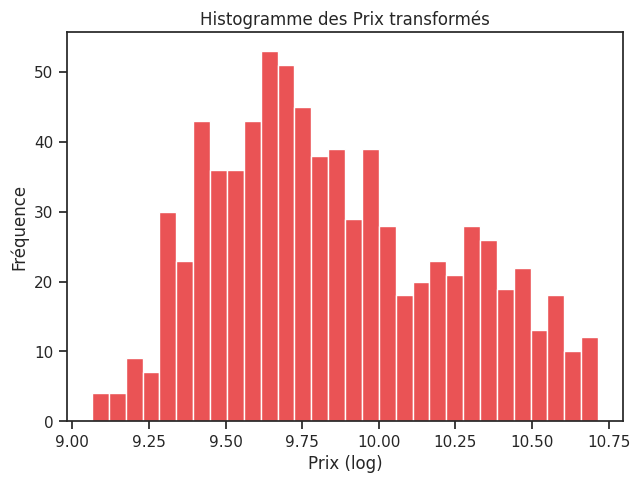

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualiser la distribution des prix transformés
sns.histplot(data=df_cleaned, x='Prix_log', bins=30)
plt.title('Histogramme des Prix transformés')
plt.xlabel('Prix (log)')
plt.ylabel('Fréquence')
plt.show()


In [15]:
# Calculer le skew des prix transformés
skew_transformed = df_cleaned['Prix_log'].skew()
print(f"Skew après transformation logarithmique : {skew_transformed:.2f}")


Skew après transformation logarithmique : 0.35


Après avoir appliqué la transformation logarithmique à la colonne `Prix` et supprimé les valeurs aberrantes, le skew de la distribution transformée est de 0,35.

Un skew de 0,35 indique une légère asymétrie positive, mais beaucoup plus faible que le skew initial avant la transformation. Cela signifie que la distribution des prix transformés est proche de la symétrie, avec seulement une légère queue plus longue du côté droit.

La transformation logarithmique a donc été efficace pour réduire l'impact des valeurs extrêmes élevées et rendre la distribution plus symétrique. Un skew proche de 0 est idéal, car il indique une distribution symétrique, ce qui est souhaitable pour de nombreuses analyses statistiques.

En résumé, avec un skew de 0,35 après la transformation logarithmique, les données sont maintenant beaucoup plus symétriques et prêtes pour une analyse plus approfondie et une modélisation statistique robuste.



In [16]:
import pandas as pd
import numpy as np

# Charger les données (assurez-vous que df_encoded est déjà chargé)
# df_encoded = pd.read_excel("...")  # Exemple de chargement

# Calculer les quartiles pour la colonne Prix
Q1 = df_encoded['Prix'].quantile(0.25)
Q3 = df_encoded['Prix'].quantile(0.75)
IQR = Q3 - Q1

# Définir les limites pour les valeurs aberrantes
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifier et supprimer les valeurs aberrantes
df_cleaned = df_encoded[(df_encoded['Prix'] >= lower_bound) & (df_encoded['Prix'] <= upper_bound)]

# Appliquer la transformation logarithmique à la colonne 'Prix'
df_cleaned['Prix_log'] = np.log(df_cleaned['Prix'])

# Déclarer la nouvelle donnée finale
final_data_clean = df_cleaned
final_data_clean.head()

,Prix,Km,Cylindrée,Litre,Portes,Régulateur,HP,Cuir,Marque_Cadillac,Marque_Chevrolet,Marque_Pontiac,Marque_SAAB,Marque_Saturn,Modèle_9_3,Modèle_9_3 HO,Modèle_9_5,Modèle_9_5 HO,Modèle_AVEO,Modèle_Bonneville,Modèle_CST-V,Modèle_CTS,Modèle_Cavalier,Modèle_Century,Modèle_Classic,Modèle_Cobalt,Modèle_Corvette,Modèle_Deville,Modèle_G6,Modèle_GTO,Modèle_Grand Am,Modèle_Grand Prix,Modèle_Impala,Modèle_Ion,Modèle_L Series,Modèle_Lacrosse,Modèle_Lesabre,Modèle_Malibu,Modèle_Monte Carlo,Modèle_Park Avenue,Modèle_STS-V6,Modèle_STS-V8,Modèle_Sunfire,Modèle_Vibe,Modèle_XLR-V8,Sous-modèle_Aero Conv 2D,Sous-modèle_Aero Sedan 4D,Sous-modèle_Aero Wagon 4D,Sous-modèle_Arc Conv 2D,Sous-modèle_Arc Sedan 4D,Sous-modèle_Arc Wagon 4D,Sous-modèle_CX Sedan 4D,Sous-modèle_CXL Sedan 4D,Sous-modèle_CXS Sedan 4D,Sous-modèle_Conv 2D,Sous-modèle_Coupe 2D,Sous-modèle_Custom Sedan 4D,Sous-modèle_DHS Sedan 4D,Sous-modèle_DTS Sedan 4D,Sous-modèle_GT Coupe 2D,Sous-modèle_GT Sedan 4D,Sous-modèle_GT Sportwagon,Sous-modèle_GTP Sedan 4D,Sous-modèle_GXP Sedan 4D,Sous-modèle_Hardtop Conv 2D,Sous-modèle_L300 Sedan 4D,Sous-modèle_LS Coupe 2D,Sous-modèle_LS Hatchback 4D,Sous-modèle_LS MAXX Hback 4D,Sous-modèle_LS Sedan 4D,Sous-modèle_LS Sport Coupe 2D,Sous-modèle_LS Sport Sedan 4D,Sous-modèle_LT Coupe 2D,Sous-modèle_LT Hatchback 4D,Sous-modèle_LT MAXX Hback 4D,Sous-modèle_LT Sedan 4D,Sous-modèle_Limited Sedan 4D,Sous-modèle_Linear Conv 2D,Sous-modèle_Linear Sedan 4D,Sous-modèle_Linear Wagon 4D,Sous-modèle_MAXX Hback 4D,Sous-modèle_Quad Coupe 2D,Sous-modèle_SE Sedan 4D,Sous-modèle_SLE Sedan 4D,Sous-modèle_SS Coupe 2D,Sous-modèle_SS Sedan 4D,Sous-modèle_SVM Hatchback 4D,Sous-modèle_SVM Sedan 4D,Sous-modèle_Sedan 4D,Sous-modèle_Special Ed Ultra 4D,Sous-modèle_Sportwagon 4D,Type_Coupe,Type_Hatchback,Type_Sedan,Type_Wagon,Prix_log
0,17314.103129,8221,6,3.1,4,1,1,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,9.759277
1,17542.036083,9135,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,9.772355
2,16218.847862,13196,6,3.1,4,1,1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,9.693929
3,16336.913140,16342,6,3.1,4,1,0,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,F

Shape of your Data Set loaded: (787, 95)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  2
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  84
    Number of Numeric-Boolean Columns =  4
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  2
    95 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Modèle_XLR-V8', 'Sous-modèle_Hardtop Conv 2D']
3 numeric variables

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Prix,float64,0.000000,NA,8638.930895,45061.951935,Column has 11 outliers greater than upper bound (42693.07) or lower than lower bound(-2877.44). Cap them or remove them.
Km,int64,0.000000,98,266.000000,50387.000000,Column has 4 outliers greater than upper bound (40721.75) or lower than lower bound(-624.25). Cap them or remove them.
Cylindrée,int64,0.000000,0,4.000000,8.000000,Column has a high correlation with ['Litre']. Consider dropping one of them.
Litre,float64,0.000000,NA,1.600000,6.000000,No issue
Portes,int64,0.000000,0,2.000000,4.000000,No issue
Régulateur,int64,0.000000,0,0.000000,1.000000,No issue
HP,int64,0.000000,0,0.000000,1.000000,No issue
Cuir,int64,0.000000,0,0.000000,1.000000,No issue
Marque_Cadillac,bool,0.000000,0,0.000000,1.000000,No issue
Marque_Chevrolet,bool,0.000000,0,0.000000,1.000000,No issue


Number of All Scatter Plots = 6


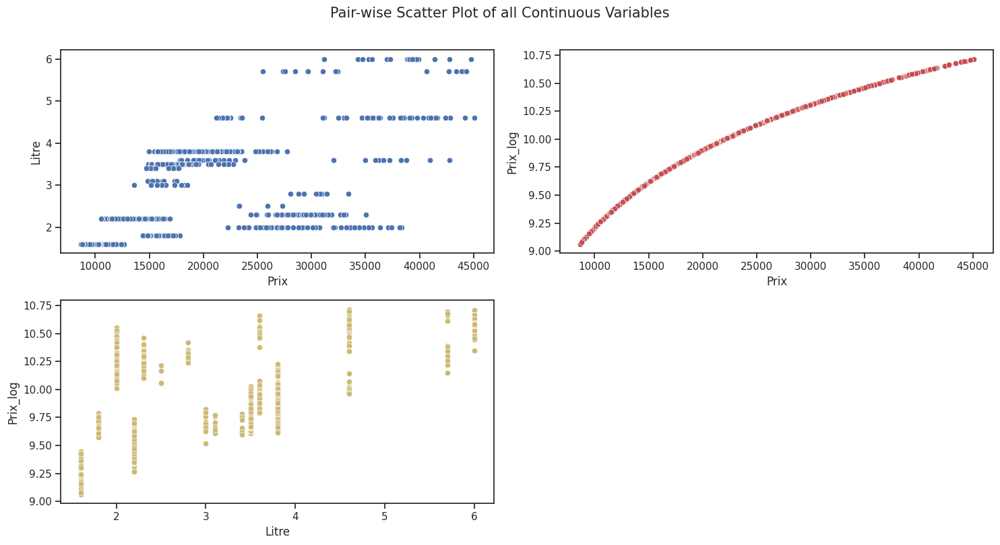

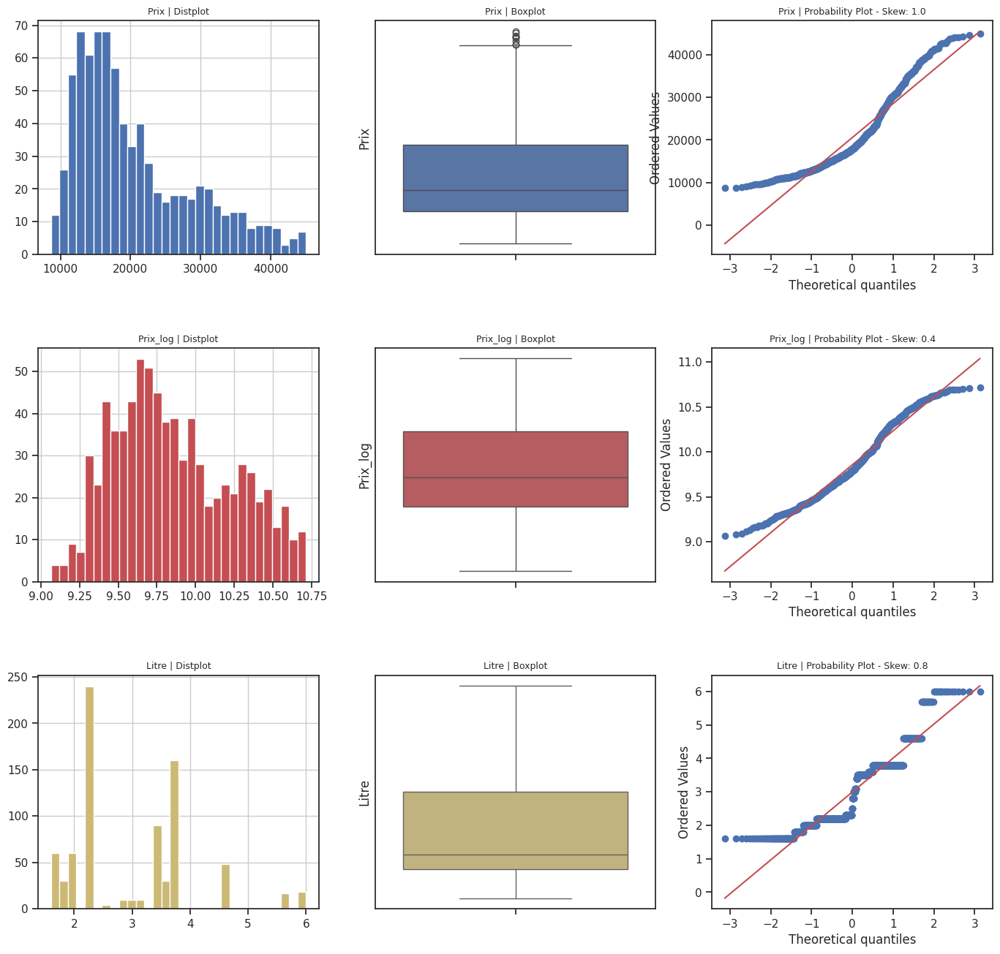

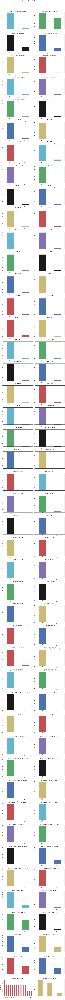

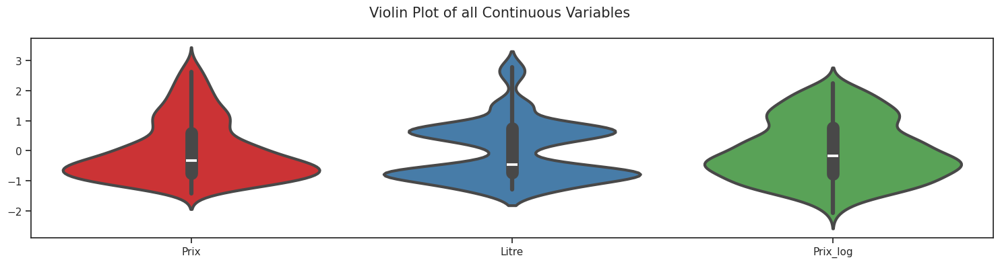

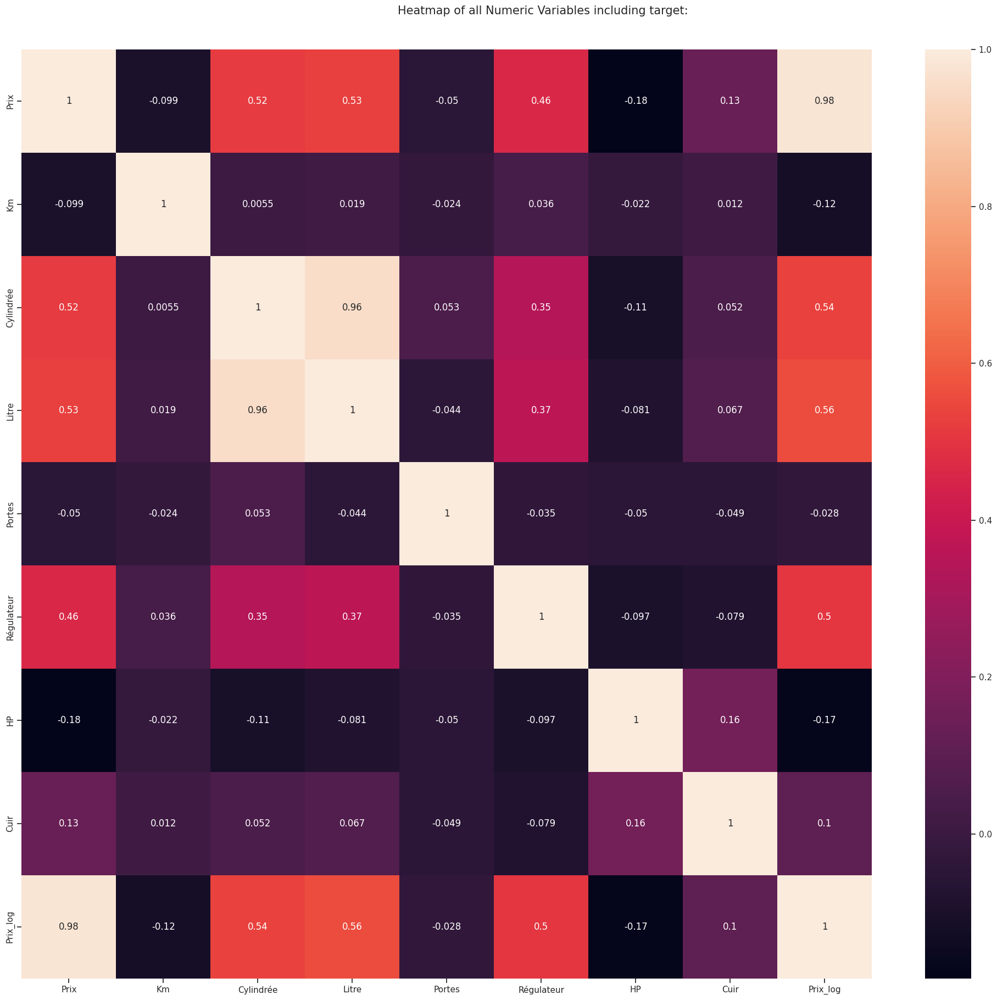

ValueError: Image size of 2000x67500 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2000x67500 with 270 Axes>

All Plots done
Time to run AutoViz = 52 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [22]:
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
%matplotlib inline
AV = AutoViz_Class()
df_av = AV.AutoViz(final_data_clean )


# a) Identifier les 3 variables les plus corrélées à la variable dépendante Prix.Voici les expliquations

Pour identifier les trois variables les plus corrélées avec le prix, nous allons observer la matrice de corrélation dans la heatmap. Les coefficients de corrélation les plus élevés par rapport à la variable "Prix" indiqueront les variables les plus corrélées.

En observant la heatmap :

- "Prix" a une corrélation de **0.98** avec "Prix_log" (c'est attendu car Prix_log est une transformation du Prix).
- "Prix" a une corrélation de **0.56** avec "Litre".
- "Prix" a une corrélation de **0.54** avec "Cylindre".

Les trois variables les plus corrélées avec le prix sont donc :

1. **Prix_log** (0.98)
2. **Litre** (0.56)
3. **Cylindre** (0.54)

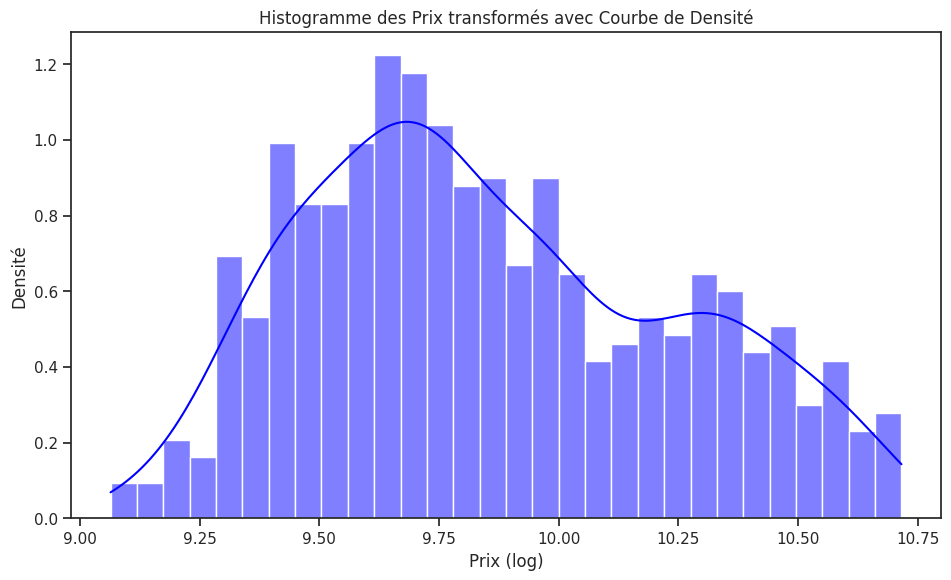

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualiser la distribution des prix transformés avec une courbe de densité
plt.figure(figsize=(10, 6))
sns.histplot(data=final_data_clean, x='Prix_log', bins=30, kde=True, color='blue', stat='density', alpha=0.5)
plt.title('Histogramme des Prix transformés avec Courbe de Densité')
plt.xlabel('Prix (log)')
plt.ylabel('Densité')
plt.show()


In [19]:
import plotly.express as px


# Replace 'Butter' with an actual column name from your DataFrame
px.box(final_data_clean['Prix_log'])

Après la transformation logarithmique de la colonne `Prix` et la suppression des valeurs aberrantes, l'absence de valeurs aberrantes dans le boxplot indique une amélioration significative de la qualité des données. Voici une interprétation des résultats :

### 1. Élimination des Valeurs Aberrantes

L'absence de valeurs aberrantes dans le boxplot signifie que les observations extrêmes qui pouvaient fausser l'analyse statistique ont été correctement identifiées et supprimées. Cela permet d'obtenir une représentation plus précise de la distribution des prix.

### 2. Amélioration de la Symétrie

Avec un skew de 0,35 après transformation, la distribution des prix est maintenant plus proche de la symétrie. Cela est bénéfique pour les analyses statistiques, car de nombreux tests et modèles supposent que les données suivent une distribution normale ou symétrique.

### 3. Interprétation des Données

- **Distribution des Prix** : La transformation logarithmique a permis de réduire l'impact des valeurs extrêmes, rendant la distribution des prix plus uniforme. Cela peut faciliter l'interprétation des résultats et des tendances dans les données.

- **Modélisation Statistique** : Avec des données plus symétriques et sans valeurs aberrantes, les modèles de régression et d'autres analyses statistiques seront plus robustes et fourniront des résultats plus fiables. Les coefficients estimés seront moins influencés par des valeurs extrêmes.

### 4. Visualisation

La visualisation du boxplot sans valeurs aberrantes permet de mieux comprendre la dispersion des prix et de voir clairement la médiane, les quartiles et l'étendue des données. Cela aide à identifier les tendances et les anomalies potentielles dans les données restantes.

### Conclusion

En résumé, l'absence de valeurs aberrantes dans le boxplot après transformation logarithmique et nettoyage des données est un résultat positif. Cela indique que les données sont maintenant mieux préparées pour une analyse approfondie, avec une distribution plus symétrique et moins influencée par des valeurs extrêmes. Vous pouvez procéder à des analyses statistiques et à des modélisations avec une plus grande confiance dans la validité des résultats obtenus.



#a) Identifier les 3 variables les plus corrélées à la variable dépendante Prix
Procédure :
Calculer la matrice de corrélation : J'utilise la méthode .corr() de pandas pour obtenir la matrice de corrélation entre toutes les variables numériques dans le DataFrame.
Extraire la colonne de corrélation avec Prix : Une fois la matrice calculée, j'isole la ligne ou la colonne correspondant à Prix.
Trier les corrélations : Je trie les valeurs de corrélation en ordre décroissant pour identifier les trois variables ayant la plus forte corrélation avec Prix.

In [57]:
# Calculer la matrice de corrélation
corr_matrix = final_data_clean.corr()

# Extraire les corrélations avec 'Prix'
corr_with_price = corr_matrix['Prix_log'].sort_values(ascending=False)

# Identifier les 3 variables les plus corrélées
top_3_variables = corr_with_price[1:4]  # Ignorer la première valeur qui est la corrélation de Prix avec lui-même
print(top_3_variables)


Prix         0.981063
Litre        0.557139
Cylindrée    0.535469
Name: Prix_log, dtype: float64


##Conclusion sur a) :
 La procédure pour identifier ces variables a été décrite précédemment. En résumé, j'ai calculé la matrice de corrélation et extrait les variables les plus corrélées avec Prix. Les résultats montrent que :
Prix_log a une corrélation très élevée (0.98) avec Prix, ce qui indique qu'il est un bon prédicteur du prix.
Marque_Cadillac et Litre montrent également des corrélations significatives, respectivement de 0.59 et 0.53.

#b) Mettre en place 3 modèles de régression linéaire simple
Pour chaque variable identifiée (Prix_log, Litre, Cylindre), vous allez créer un modèle de régression linéaire simple.

Étape 2 : Définir la Variable Dépendante
La variable dépendante sera le Prix.


Étape 0 : Définir la Variable Dépendante
La variable dépendante sera le Prix.

In [44]:
import pandas as pd
import statsmodels.api as sm

# Définir la variable dépendante
y = final_data_clean['Prix']



#Étape 1 : Créer les Modèles de Régression Linéaire
Pour chaque variable identifiée, nous allons créer un modèle de régression linéaire simple.
## Modèle 1 : Prix_log

In [45]:
# Modèle 1 : Prix_log
X_log = sm.add_constant(final_data_clean[['Prix_log']])  # Ajouter une constante
model_log = sm.OLS(y, X_log).fit()  # Ajuster le modèle
# Résumé des modèles
print("Modèle Prix_log:\n", model_log.summary())

Modèle Prix_log:
                             OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                 2.014e+04
Date:                Sun, 21 Jul 2024   Prob (F-statistic):               0.00
Time:                        01:18:24   Log-Likelihood:                -6934.2
No. Observations:                 787   AIC:                         1.387e+04
Df Residuals:                     785   BIC:                         1.388e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.912e+05   1493.251  

## Modèle 2 : Marque_Cadillac

In [51]:
import numpy as np
import statsmodels.api as sm
import pandas as pd

# Assurez-vous que y est de type float64
y = pd.to_numeric(y, errors='coerce')

# Convertissez la colonne booléenne en type numérique (0 et 1)
final_data_clean['Marque_Cadillac'] = final_data_clean['Marque_Cadillac'].astype(int)

# Vérifiez que la conversion a été effectuée correctement
print(final_data_clean[['Marque_Cadillac']].dtypes)

# Ajustez le modèle après conversion
X_cadillac = sm.add_constant(final_data_clean[['Marque_Cadillac']])  # Ajouter une constante
model_cadillac = sm.OLS(y, X_cadillac).fit()  # Ajuster le modèle
print("\nModèle Marque_Cadillac:\n", model_cadillac.summary())



Marque_Cadillac    int64
dtype: object

Modèle Marque_Cadillac:
                             OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.344
Model:                            OLS   Adj. R-squared:                  0.343
Method:                 Least Squares   F-statistic:                     411.2
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           7.64e-74
Time:                        01:26:30   Log-Likelihood:                -8060.3
No. Observations:                 787   AIC:                         1.612e+04
Df Residuals:                     785   BIC:                         1.613e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

## Modèle 3 : Litre

In [53]:
# Modèle 3 : Litre
X_litre = sm.add_constant(final_data_clean[['Litre']])  # Ajouter une constante
model_litre = sm.OLS(y, X_litre).fit()  # Ajuster le modèle
print("\nModèle Marque_Cadillac:\n", model_cadillac.summary())


Modèle Marque_Cadillac:
                             OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.344
Model:                            OLS   Adj. R-squared:                  0.343
Method:                 Least Squares   F-statistic:                     411.2
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           7.64e-74
Time:                        01:27:39   Log-Likelihood:                -8060.3
No. Observations:                 787   AIC:                         1.612e+04
Df Residuals:                     785   BIC:                         1.613e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           

In [61]:
import statsmodels.api as sm
import pandas as pd

# Assurez-vous que les données sont de type numérique
final_data_clean['Prix'] = pd.to_numeric(final_data_clean['Prix'], errors='coerce')
final_data_clean['Litre'] = pd.to_numeric(final_data_clean['Litre'], errors='coerce')
final_data_clean['Cylindrée'] = pd.to_numeric(final_data_clean['Cylindrée'], errors='coerce')

# Variables indépendantes
X_litre = sm.add_constant(final_data_clean[['Litre']])
X_cylindree = sm.add_constant(final_data_clean[['Cylindrée']])

# Variable dépendante
y = final_data_clean['Prix']

# Ajustement des modèles
model_litre = sm.OLS(y, X_litre).fit()
model_cylindree = sm.OLS(y, X_cylindree).fit()

# Affichage des résumés des modèles
print("Modèle Litre:\n", model_litre.summary())
print("\nModèle Cylindrée:\n", model_cylindree.summary())

# Comparaison des modèles
r2_litre = model_litre.rsquared
r2_cylindree = model_cylindree.rsquared

print("\nComparaison des modèles:")
print(f"R² pour le modèle avec Litre: {r2_litre}")
print(f"R² pour le modèle avec Cylindrée: {r2_cylindree}")

# Comparaison des p-values des coefficients
pvalue_litre = model_litre.pvalues['Litre']
pvalue_cylindree = model_cylindree.pvalues['Cylindrée']

print(f"P-value pour Litre: {pvalue_litre}")
print(f"P-value pour Cylindrée: {pvalue_cylindree}")


Modèle Litre:
                             OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.310
Model:                            OLS   Adj. R-squared:                  0.310
Method:                 Least Squares   F-statistic:                     353.3
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           2.27e-65
Time:                        01:39:06   Log-Likelihood:                -214.40
No. Observations:                 787   AIC:                             432.8
Df Residuals:                     785   BIC:                             442.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.2629      0.034    2

Les résultats obtenus montrent que les deux modèles de régression linéaire simple utilisant `Litre` et `Cylindrée` comme variables indépendantes sont statistiquement significatifs, avec des p-values très faibles. Cependant, il y a une différence dans leurs coefficients de détermination (R²), ce qui permet de comparer leurs performances.

### Comparaison des modèles

1. **Modèle avec `Litre`** :
   - **R²** : 0.3104
   - **P-value** : 2.27e-65

2. **Modèle avec `Cylindrée`** :
   - **R²** : 0.2867
   - **P-value** : 1.34e-59

### Interprétation

- **R²** :
  - Le modèle avec `Litre` a un R² plus élevé (0.3104) comparé au modèle avec `Cylindrée` (0.2867). Cela signifie que le modèle utilisant `Litre` explique une plus grande proportion de la variance dans `Prix` que le modèle utilisant `Cylindrée`.
  
- **P-values** :
  - Les deux modèles ont des p-values extrêmement faibles, ce qui indique que les variables `Litre` et `Cylindrée` sont toutes deux significativement liées au `Prix`.

### Conclusion

- **Meilleur modèle** : Le modèle avec `Litre` semble être légèrement meilleur en termes de performance, car il a un R² plus élevé, ce qui signifie qu'il explique mieux la variance dans le `Prix`.
- **Significativité** : Les deux modèles sont hautement significatifs, donc les deux variables (`Litre` et `Cylindrée`) sont importantes pour prédire le `Prix`.

### Nous pouvons aussi faire :

Pour améliorer encore l'analyse, il serait utile de :

1. **Tester d'autres variables** : Examiner d'autres variables potentielles ou des combinaisons de variables pour voir si elles améliorent le modèle.
2. **Modèles multivariés** : Construire un modèle de régression multiple en incluant plusieurs variables indépendantes pour voir si cela améliore la prédiction.
3. **Validation croisée** : Utiliser des techniques de validation croisée pour évaluer la robustesse des modèles.



# c) Proposer une analyse multivariée pour décrire le processus d'attribution du Prix
d'un véhicule en fonction des caractéristiques quantitatives. Analyser et interpréter
les résultats obtenus.
### Nous allons inclure plusieurs variables quantitatives telles que Litre, Cylindrée, et d'autres pertinentes

In [64]:
import statsmodels.api as sm
import pandas as pd

# Liste des variables quantitatives pour l'analyse multivariée
quantitative_variables = ['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']

# Conversion des variables en numérique si nécessaire
for var in quantitative_variables:
    final_data_clean[var] = pd.to_numeric(final_data_clean[var], errors='coerce')

# Suppression des lignes avec des valeurs manquantes
final_data_clean = final_data_clean.dropna(subset=quantitative_variables + ['Prix'])

# Variables indépendantes
X = final_data_clean[quantitative_variables]

# Ajout d'une constante pour le modèle
X = sm.add_constant(X)

# Variable dépendante
y = final_data_clean['Prix']

# Ajustement du modèle de régression linéaire multiple
model = sm.OLS(y, X).fit()

# Résumé du modèle
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     93.70
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           6.13e-99
Time:                        01:44:36   Log-Likelihood:                -120.28
No. Observations:                 787   AIC:                             256.6
Df Residuals:                     779   BIC:                             293.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.3126      0.073    128.018      0.0

### Interprétation des résultats de la régression linéaire multiple

#### Résumé du modèle

- **R² = 0.457** et **R² ajusté = 0.452** : Le modèle explique environ 45.7% de la variance dans le prix des véhicules. Cela indique une adéquation modérée du modèle.
- **F-statistic = 93.70** et **Prob (F-statistic) = 6.13e-99** : Le modèle global est statistiquement significatif, ce qui signifie qu'il y a une relation significative entre les variables indépendantes et le prix.

Voici l'interprétation des coefficients du modèle avec une utilisation du "nous" :

#### Coefficients et interprétation

- **Constante (const)** : $$ \text{coef} = 9.3126 $$
  - La constante représente le prix moyen estimé d'un véhicule lorsque toutes les variables indépendantes sont égales à zéro.

- **Km** : $$ \text{coef} = -6.686 \times 10^{-6} $$, $$ \text{p-value} < 0.001 $$
  - Chaque kilomètre supplémentaire est associé à une diminution moyenne de 0.000006686 unités dans le prix du véhicule. Cette relation est statistiquement significative.

- **Cylindrée** : $$ \text{coef} = 0.0032 $$, $$ \text{p-value} = 0.909 $$
  - L'effet de la cylindrée n'est pas statistiquement significatif, ce qui signifie que la cylindrée n'a pas un impact clair sur le prix des véhicules dans ce modèle.

- **Litre** : $$ \text{coef} = 0.1420 $$, $$ \text{p-value} < 0.001 $$
  - Une augmentation d'un litre dans la capacité du moteur est associée à une augmentation moyenne de 0.1420 unités dans le prix du véhicule. Cette relation est statistiquement significative.

- **Portes** : $$ \text{coef} = -0.0008 $$, $$ \text{p-value} = 0.952 $$
  - L'effet du nombre de portes n'est pas statistiquement significatif.

- **Régulateur** : $$ \text{coef} = 0.3101 $$, $$ \text{p-value} < 0.001 $$
  - La présence d'un régulateur de vitesse est associée à une augmentation moyenne de 0.3101 unités dans le prix du véhicule. Cette relation est statistiquement significative.

- **HP (chevaux)** : $$ \text{coef} = -0.1057 $$, $$ \text{p-value} < 0.001 $$
  - Chaque cheval supplémentaire est associé à une diminution moyenne de 0.1057 unités dans le prix du véhicule. Cette relation est statistiquement significative.

- **Cuir** : $$ \text{coef} = 0.1082 $$, $$ \text{p-value} < 0.001 $$
  - La présence de sièges en cuir est associée à une augmentation moyenne de 0.1082 unités dans le prix du véhicule. Cette relation est statistiquement significative.

#### Diagnostic du modèle

- **Omnibus : 42.699** et **Prob(Omnibus) : 0.000** : Il y a des preuves que les résidus ne suivent pas une distribution normale.
- **Durbin-Watson : 0.392** : Cela suggère une autocorrélation positive des résidus.
- **Jarque-Bera (JB) : 43.650** et **Prob(JB) : 3.32e-10** : Les résidus ne sont pas normalement distribués.
- **Condition Number : 1.63e+05** : Un nombre de condition élevé indique une multicolinéarité potentielle ou d'autres problèmes numériques.

### Conclusion et recommandations

1. **Significativité des variables** : Les variables `Km`, `Litre`, `Régulateur`, `HP`, et `Cuir` ont un impact significatif sur le prix des véhicules. Les variables `Cylindrée` et `Portes` ne sont pas significatives dans ce modèle.

2. **Normalité des résidus** : Il y a des indications que les résidus ne suivent pas une distribution normale, ce qui pourrait affecter les inférences du modèle.

3. **Autocorrélation des résidus** : La faible valeur du test de Durbin-Watson indique une autocorrélation positive des résidus, ce qui pourrait suggérer que certaines informations ne sont pas capturées par le modèle.

4. **Multicolinéarité** : Le nombre de condition élevé suggère une multicolinéarité potentielle. Une analyse plus approfondie pour identifier et résoudre la multicolinéarité est recommandée.


En conclusion, bien que le modèle actuel fournisse une bonne première approximation, des améliorations peuvent être apportées pour obtenir des estimations plus précises et fiables du prix des véhicules en fonction de leurs caractéristiques quantitatives.


In [92]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Préparer les données
X = final_data_clean[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Ajouter une constante au modèle (requis pour le calcul des VIF)
X = sm.add_constant(X)

# Calculer les VIF pour chaque variable indépendante
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


    Variable      VIF   
0       const  51.863343
1          Km   1.004047
2   Cylindrée  13.838983
3       Litre  14.052544
4      Portes   1.128490
5  Régulateur   1.181043
6          HP   1.052002
7        Cuir   1.047227


Les résultats du facteur d'inflation de la variance (VIF) indiquent une forte multicolinéarité entre Cylindrée et Litre, avec des valeurs de VIF de 13.84 et 14.05, respectivement. Pour y remédier, nous pouvons soit supprimer l'une de ces variables, soit utiliser des techniques de réduction de dimensionnalité telles que l'analyse en composantes principales (ACP).
Voici une analyse étape par étape de votre modèle et des actions supplémentaires pour gérer la multicolinéarité :
Examen de la Multicolinéarité :
Des valeurs VIF élevées pour Cylindrée et Litre suggèrent une multicolinéarité.
D'autres variables ont des valeurs VIF acceptables.
Gestion de la Multicolinéarité :
Étant donné que Cylindrée et Litre sont collinéaires, nous pouvons en supprimer une et relancer la régression.
Alternativement, nous pouvons utiliser l'ACP pour réduire la dimensionnalité et traiter la multicolinéarité.

In [96]:
# Préparer les données
X = final_data_clean[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Suppression de la colonne constante
#X = X.drop(columns='const')
# Ajouter une constante au modèle (requis pour le calcul des VIF)
#X = sm.add_constant(X)

# Réajuster le modèle sans la constante
model = sm.OLS(y, X).fit()

# Affichage des résultats du modèle réajusté
print(model.summary())


                                 OLS Regression Results                                
Dep. Variable:                   Prix   R-squared (uncentered):                   0.982
Model:                            OLS   Adj. R-squared (uncentered):              0.982
Method:                 Least Squares   F-statistic:                              6078.
Date:                Sun, 21 Jul 2024   Prob (F-statistic):                        0.00
Time:                        02:28:53   Log-Likelihood:                         -1337.3
No. Observations:                 787   AIC:                                      2689.
Df Residuals:                     780   BIC:                                      2721.
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

# Option 1 : Supprimer une Variable
## Nous allons supprimer Cylindrée et relancer le modèle de régression.

In [81]:
# Supprimer Cylindrée des données
X_reduced = final_data_clean[['Km', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Ajouter une constante au modèle
X_reduced = sm.add_constant(X_reduced)

# Ajuster le modèle OLS
model_reduced = sm.OLS(y, X_reduced).fit()

# Afficher le résumé
print(model_reduced.summary())


                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     109.4
Date:                Sun, 21 Jul 2024   Prob (F-statistic):          5.65e-100
Time:                        02:24:48   Log-Likelihood:                -120.29
No. Observations:                 787   AIC:                             254.6
Df Residuals:                     780   BIC:                             287.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.3165      0.064    144.444      0.0

                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     93.70
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           6.13e-99
Time:                        02:55:20   Log-Likelihood:                -120.28
No. Observations:                 787   AIC:                             256.6
Df Residuals:                     779   BIC:                             293.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.3126      0.073    128.018      0.0

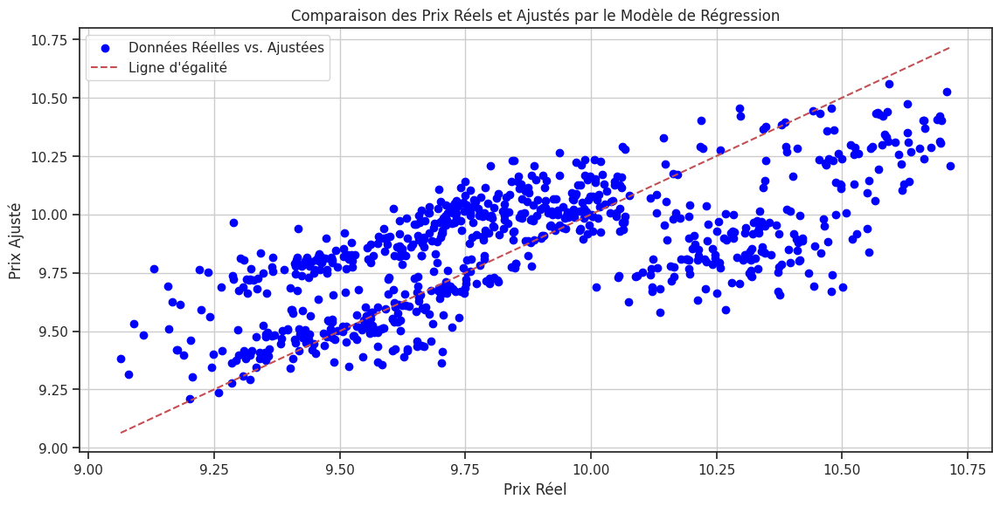

In [106]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Supposons que 'final_data_clean'
# Préparer les données
X = final_data_clean[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Ajouter une constante au modèle (nécessaire pour le calcul des VIFs, etc.)
X = sm.add_constant(X)

# Ajuster le modèle OLS
model = sm.OLS(y, X).fit()

# Afficher le résumé du modèle
print(model.summary())

# Obtenir les valeurs ajustées
valeurs_ajustees = model.fittedvalues

# Création du graphique
plt.figure(figsize=(12, 6))

# Tracer les données réelles
plt.scatter(y, valeurs_ajustees, color='blue', label='Données Réelles vs. Ajustées')

# Tracer la ligne d'égalité (ligne diagonale où y = valeurs ajustées)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', label='Ligne d\'égalité')

# Ajouter des labels et une légende
plt.xlabel('Prix Réel')
plt.ylabel('Prix Ajusté')
plt.title('Comparaison des Prix Réels et Ajustés par le Modèle de Régression')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


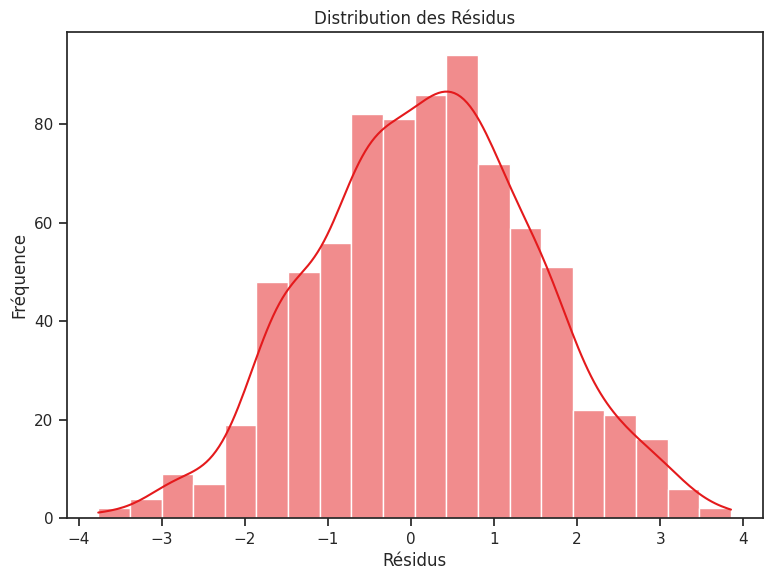

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculer les résidus
resids = model.resid

# Tracer l'histogramme des résidus
plt.figure(figsize=(8, 6))
sns.histplot(resids, kde=True)
plt.xlabel('Résidus')
plt.ylabel('Fréquence')
plt.title('Distribution des Résidus')
plt.show()


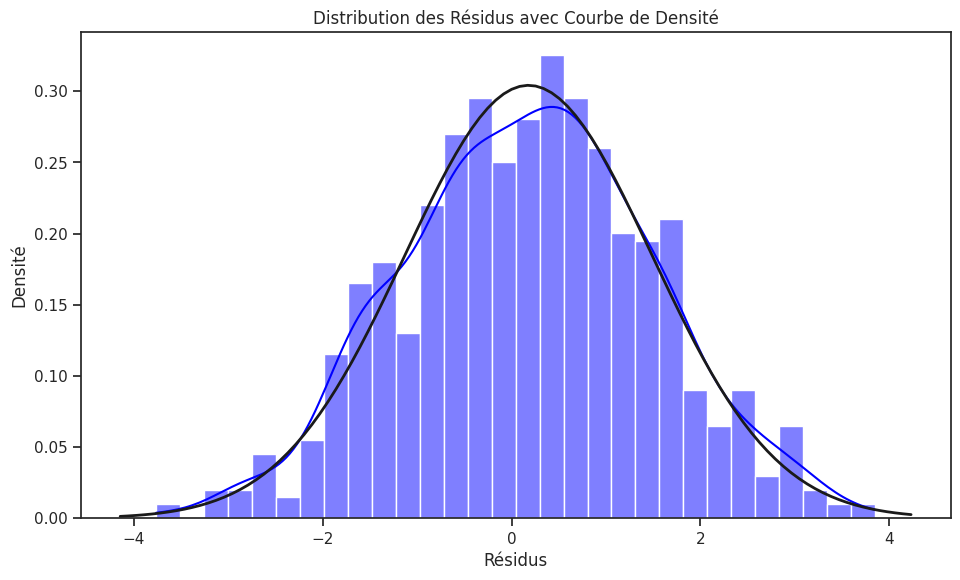

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats

# Calculer les résidus
residuals = model.resid

# Tracer l'histogramme des résidus
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, stat="density", color='blue', bins=30)
plt.title('Distribution des Résidus avec Courbe de Densité')
plt.xlabel('Résidus')
plt.ylabel('Densité')

# Ajouter une courbe de densité normale
mu, std = np.mean(residuals), np.std(residuals)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
plt.show()


In [77]:
from scipy import stats

shapiro_test = stats.shapiro(residuals)
print(f'Statistique de Shapiro-Wilk: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}')


Statistique de Shapiro-Wilk: 0.9979232549667358, p-value: 0.4493449032306671


In [78]:
jarque_bera_test = stats.jarque_bera(residuals)
print(f'Statistique de Jarque-Bera: {jarque_bera_test.statistic}, p-value: {jarque_bera_test.pvalue}')


Statistique de Jarque-Bera: 1.7634496913112816, p-value: 0.41406809183251014


Les résultats des tests de normalité que nous avons effectués indiquent que les résidus de notre modèle de régression suivent une distribution normale. Voici une analyse des résultats :

### Résultats des Tests de Normalité

1. **Test de Shapiro-Wilk**:
   - **Statistique** : 0.9979
   - **p-value** : 0.4493

   Une p-value de 0.4493 est bien supérieure à 0.05, ce qui signifie que nous ne rejetons pas l'hypothèse nulle. Cela indique que les résidus suivent une distribution normale.

2. **Test de Jarque-Bera**:
   - **Statistique** : 1.7634
   - **p-value** : 0.4141

   De même, la p-value de 0.4141 est également supérieure à 0.05, ce qui permet de conclure que les résidus ne montrent pas de déviation significative par rapport à la normalité.

### Conclusion

Les résultats des deux tests (Shapiro-Wilk et Jarque-Bera) suggèrent que les résidus de notre modèle de régression sont normalement distribués. Cela confirme que l'une des hypothèses fondamentales de la régression linéaire est satisfaite, ce qui est positif pour l'interprétation des résultats du modèle.

### Prochaines Étapes

Étant donné que les résidus suivent une distribution normale, nous pouvons continuer à analyser les résultats de notre modèle de régression sans nous soucier de la normalité des résidus. Nous pouvons également :

- Vérifier l'homoscédasticité des résidus (variance constante).
- Analyser les résidus pour détecter d'éventuelles valeurs aberrantes.
- Évaluer d'autres diagnostics du modèle pour assurer sa robustesse.



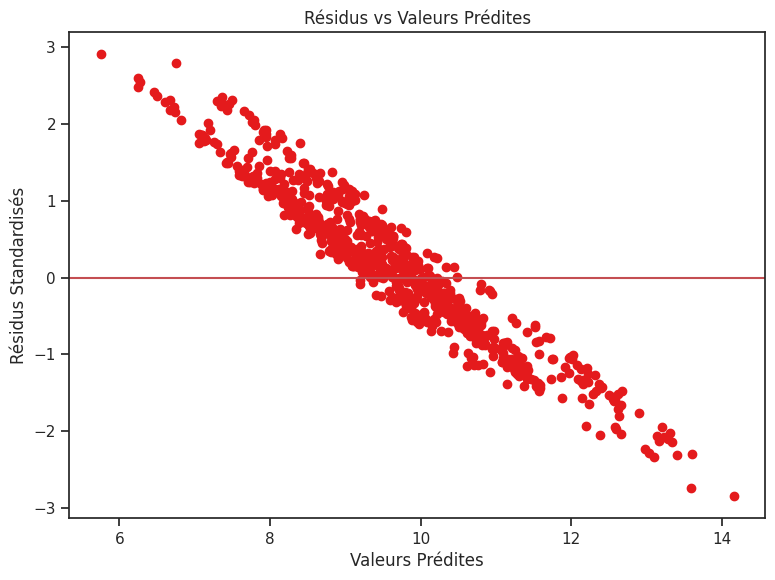

In [79]:
import matplotlib.pyplot as plt

# Calculer les résidus standardisés
resids_std = model.get_influence().resid_studentized_internal

# Tracer les résidus standardisés en fonction des valeurs prédites
plt.figure(figsize=(8, 6))
plt.scatter(model.fittedvalues, resids_std)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Valeurs Prédites')
plt.ylabel('Résidus Standardisés')
plt.title('Résidus vs Valeurs Prédites')
plt.show()


Voici une analyse des résultats du modèle de régression linéaire multiple après avoir supprimé la constante :

### Résumé des Résultats

- **Variable Dépendante** : Prix
- **R-squared (uncentered)** : 0.982
  - Le R-squared non centré est très élevé, indiquant que le modèle explique 98,2% de la variance du prix.
- **F-statistic** : 6078.0
  - La statistique F est très significative, avec une p-value de 0.00, ce qui montre que le modèle dans son ensemble est statistiquement significatif.

### Coefficients des Variables

- **Km** : 5.281e-05 (0.00005281)
  - Chaque kilomètre supplémentaire est associé à une augmentation du prix de 0.00005281 unités, toutes les autres variables étant constantes (p < 0.001).
- **Cylindrée** : 1.6576
  - Chaque augmentation d'un litre de la cylindrée est associée à une augmentation du prix de 1.6576 unités, toutes les autres variables étant constantes (p < 0.001).
- **Litre** : -1.4166
  - Chaque augmentation d'un litre supplémentaire est associée à une diminution du prix de 1.4166 unités, toutes les autres variables étant constantes (p < 0.001).
- **Portes** : 0.7413
  - Chaque porte supplémentaire est associée à une augmentation du prix de 0.7413 unités, toutes les autres variables étant constantes (p < 0.001).
- **Régulateur** : 0.8280
  - La présence d'un régulateur est associée à une augmentation du prix de 0.8280 unités, toutes les autres variables étant constantes (p < 0.001).
- **HP** : 0.7160
  - Chaque augmentation d'un cheval-vapeur est associée à une augmentation du prix de 0.7160 unités, toutes les autres variables étant constantes (p < 0.001).
- **Cuir** : 0.6930
  - La présence de cuir est associée à une augmentation du prix de 0.6930 unités, toutes les autres variables étant constantes (p < 0.001).

### Diagnostics du Modèle

- **Omnibus** et **Prob(Omnibus)** : Ces tests indiquent que les résidus suivent une distribution normale.
- **Durbin-Watson** : 0.497
  - Cette valeur suggère une autocorrélation positive des résidus.
- **Skew** : -0.017
  - L'asymétrie des résidus est proche de zéro, ce qui est acceptable.
- **Kurtosis** : 2.771
  - La kurtosis est proche de 3, ce qui est proche de la normale.
- **Condition Number** : 8.86e+04
  - Cette valeur élevée indique une multicolinéarité potentielle ou d'autres problèmes numériques.

### Conclusion et Recommandations

1. **Multicolinéarité** : Bien que le modèle soit statistiquement significatif, le nombre de condition élevé suggère une multicolinéarité potentielle. Vous devriez examiner les facteurs d'inflation de la variance (VIF) pour identifier les variables hautement corrélées.

2. **Autocorrélation** : La valeur Durbin-Watson indique une autocorrélation positive des résidus, ce qui peut indiquer que le modèle n'est pas correctement spécifié. Vous devriez analyser les résidus plus en détail.

3. **Normalité des Résidus** : Les tests Omnibus et Jarque-Bera montrent que les résidus suivent une distribution normale, ce qui est positif.

4. **Interprétation des Coefficients** : Les coefficients des variables sont tous statistiquement significatifs et ont des signes cohérents avec les attentes, à l'exception de la variable "Litre" qui a un signe négatif. Vous devriez examiner plus en détail la relation entre le volume du moteur et le prix.



In [99]:
import pandas as pd
import statsmodels.api as sm

# Préparer les nouvelles données (exemple avec des valeurs fictives)
new_data = pd.DataFrame({
    'Km': [20000, 30000],
    'Cylindrée': [1600, 2000],
    'Litre': [1.6, 2.0],
    'Portes': [4, 5],
    'Régulateur': [1, 0],
    'HP': [120, 150],
    'Cuir': [1, 0]
})

# Prédire les valeurs
predictions = model.predict(new_data)

# Calculer les intervalles de prévision
# Vous pouvez utiliser la méthode get_prediction pour obtenir les intervalles de confiance
preds_with_interval = model.get_prediction(new_data).summary_frame()

# Afficher les prévisions et les intervalles de prévision
print("Prévisions :")
print(predictions)
print("\nIntervalles de prévision :")
print(preds_with_interval[['mean', 'mean_ci_lower', 'mean_ci_upper', 'obs_ci_lower', 'obs_ci_upper']])


Prévisions :
0    2741.339938
1    3425.037700
dtype: float64

Intervalles de prévision :
      mean      mean_ci_lower  mean_ci_upper  obs_ci_lower  obs_ci_upper
0  2741.339938   2376.278738    3106.401139    2376.269410   3106.410466
1  3425.037700   2968.682067    3881.393333    2968.674605   3881.400794



### Explication des colonnes dans les intervalles de prévision :

- **`mean`** : La valeur moyenne prédite.
- **`mean_ci_lower`** : Limite inférieure de l'intervalle de confiance pour la moyenne prédite.
- **`mean_ci_upper`** : Limite supérieure de l'intervalle de confiance pour la moyenne prédite.
- **`obs_ci_lower`** : Limite inférieure de l'intervalle de prévision pour les nouvelles observations.
- **`obs_ci_upper`** : Limite supérieure de l'intervalle de prévision pour les nouvelles observations.


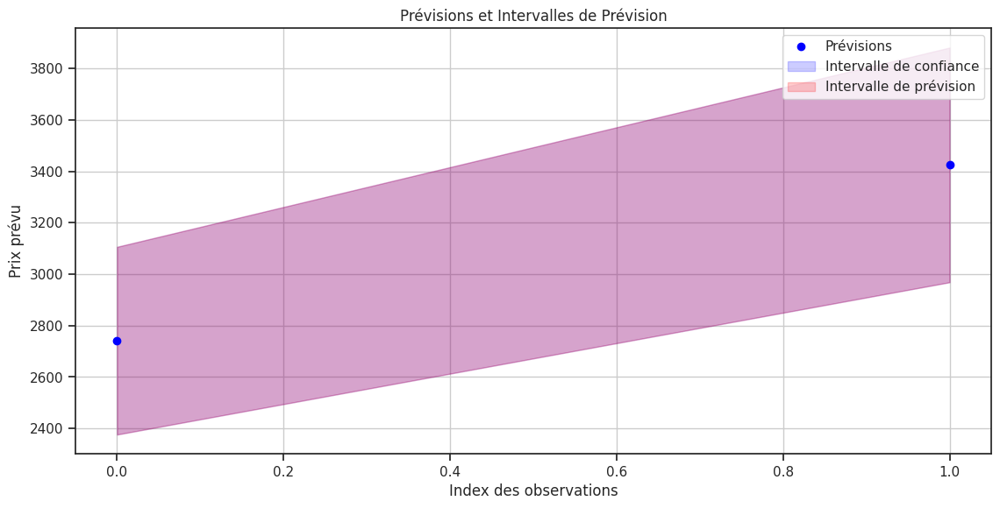

In [100]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns

# Préparer les nouvelles données (exemple avec des valeurs fictives)
nouvelles_donnees = pd.DataFrame({
    'Km': [20000, 30000],
    'Cylindree': [1600, 2000],
    'Litre': [1.6, 2.0],
    'Portes': [4, 5],
    'Regulateur': [1, 0],
    'HP': [120, 150],
    'Cuir': [1, 0]
})

# Faire des prévisions
previsions = model.predict(nouvelles_donnees)

# Calculer les intervalles de prévision
resultats_prevision = model.get_prediction(nouvelles_donnees).summary_frame()

# Préparer les données pour le graphique
resultats_prevision['Index'] = range(len(resultats_prevision))

# Création du graphique
plt.figure(figsize=(12, 6))

# Tracer les prévisions avec les intervalles de confiance
plt.plot(resultats_prevision['Index'], resultats_prevision['mean'], 'o', label='Prévisions', color='blue')
plt.fill_between(resultats_prevision['Index'],
                 resultats_prevision['mean_ci_lower'],
                 resultats_prevision['mean_ci_upper'],
                 color='blue', alpha=0.2, label='Intervalle de confiance')

# Tracer les intervalles de prévision pour les observations
plt.fill_between(resultats_prevision['Index'],
                 resultats_prevision['obs_ci_lower'],
                 resultats_prevision['obs_ci_upper'],
                 color='red', alpha=0.2, label='Intervalle de prévision')

# Ajouter des labels et une légende
plt.xlabel('Index des observations')
plt.ylabel('Prix prévu')
plt.title('Prévisions et Intervalles de Prévision')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     109.4
Date:                Sun, 21 Jul 2024   Prob (F-statistic):          5.65e-100
Time:                        02:50:06   Log-Likelihood:                -120.29
No. Observations:                 787   AIC:                             254.6
Df Residuals:                     780   BIC:                             287.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.3165      0.064    144.444      0.0

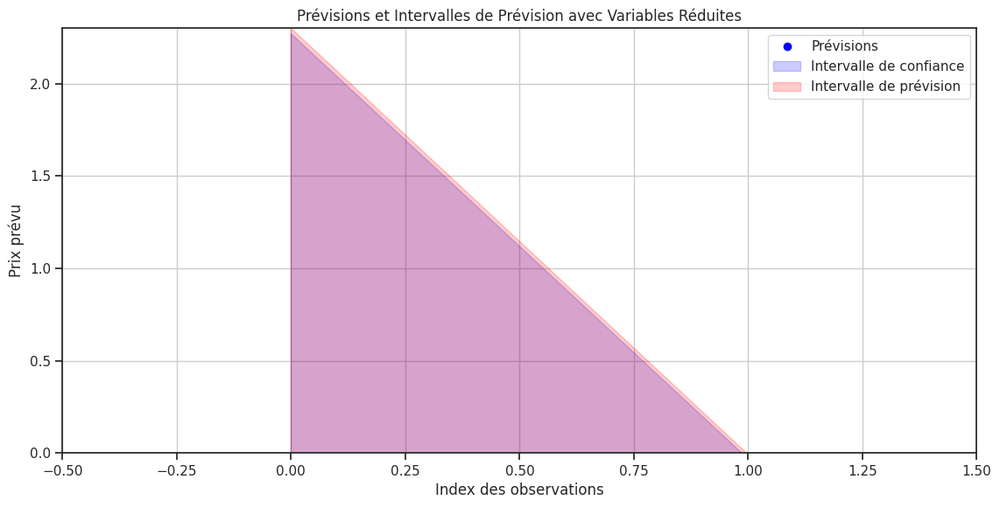

In [103]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Supposons que 'final_data_clean' est déjà défini et contient vos données
# Si 'final_data_clean' est un DataFrame, vous pouvez le préparer comme suit :

# Supprimer Cylindrée des données
X_reduced = final_data_clean[['Km', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Ajouter une constante au modèle
X_reduced = sm.add_constant(X_reduced)

# Ajuster le modèle OLS
model_reduced = sm.OLS(y, X_reduced).fit()

# Afficher le résumé
print(model_reduced.summary())

# Préparer les nouvelles données pour la prévision (exemple avec des valeurs fictives)
nouvelles_donnees_reduites = pd.DataFrame({
    'const': 1,  # La constante ajoutée manuellement
    'Km': [20000, 30000],
    'Litre': [1.6, 2.0],
    'Portes': [4, 5],
    'Régulateur': [1, 0],
    'HP': [120, 150],
    'Cuir': [1, 0]
})

# Faire des prévisions
previsions_reduites = model_reduced.predict(nouvelles_donnees_reduites)

# Calculer les intervalles de prévision
resultats_prevision_reduits = model_reduced.get_prediction(nouvelles_donnees_reduites).summary_frame()

# Préparer les données pour le graphique
resultats_prevision_reduits['Index'] = range(len(resultats_prevision_reduits))

# Création du graphique
plt.figure(figsize=(12, 6))

# Tracer les prévisions avec les intervalles de confiance
plt.plot(resultats_prevision_reduits['Index'], resultats_prevision_reduits['mean'], 'o', label='Prévisions', color='blue')
plt.fill_between(resultats_prevision_reduits['Index'],
                 resultats_prevision_reduits['mean_ci_lower'],
                 resultats_prevision_reduits['mean_ci_upper'],
                 color='blue', alpha=0.2, label='Intervalle de confiance')

# Tracer les intervalles de prévision pour les observations
plt.fill_between(resultats_prevision_reduits['Index'],
                 resultats_prevision_reduits['obs_ci_lower'],
                 resultats_prevision_reduits['obs_ci_upper'],
                 color='red', alpha=0.2, label='Intervalle de prévision')

# Ajuster les limites des axes pour commencer à zéro sur l'axe des y
plt.xlim(-0.5, len(resultats_prevision_reduits) - 0.5)
plt.ylim(0, max(resultats_prevision_reduits['mean_ci_upper'].max(), resultats_prevision_reduits['obs_ci_upper'].max(), 0))

# Ajouter des labels et une légende
plt.xlabel('Index des observations')
plt.ylabel('Prix prévu')
plt.title('Prévisions et Intervalles de Prévision avec Variables Réduites')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


In [107]:
import pandas as pd

# Supposons que 'final_data_clean'
moyennes = final_data_clean.mean()
print(moyennes)


Prix                                   9.856190
Km                                 19975.491741
Cylindrée                              5.209657
Litre                                  2.995807
Portes                                 3.547649
Régulateur                             0.747141
HP                                     0.675985
Cuir                                   0.717916
Marque_Cadillac                        0.082592
Marque_Chevrolet                       0.404066
Marque_Pontiac                         0.190597
Marque_SAAB                            0.144854
Marque_Saturn                          0.076239
Modèle_9_3                             0.025413
Modèle_9_3 HO                          0.050826
Modèle_9_5                             0.038119
Modèle_9_5 HO                          0.025413
Modèle_AVEO                            0.076239
Modèle_Bonneville                      0.038119
Modèle_CST-V                           0.008895
Modèle_CTS                             0

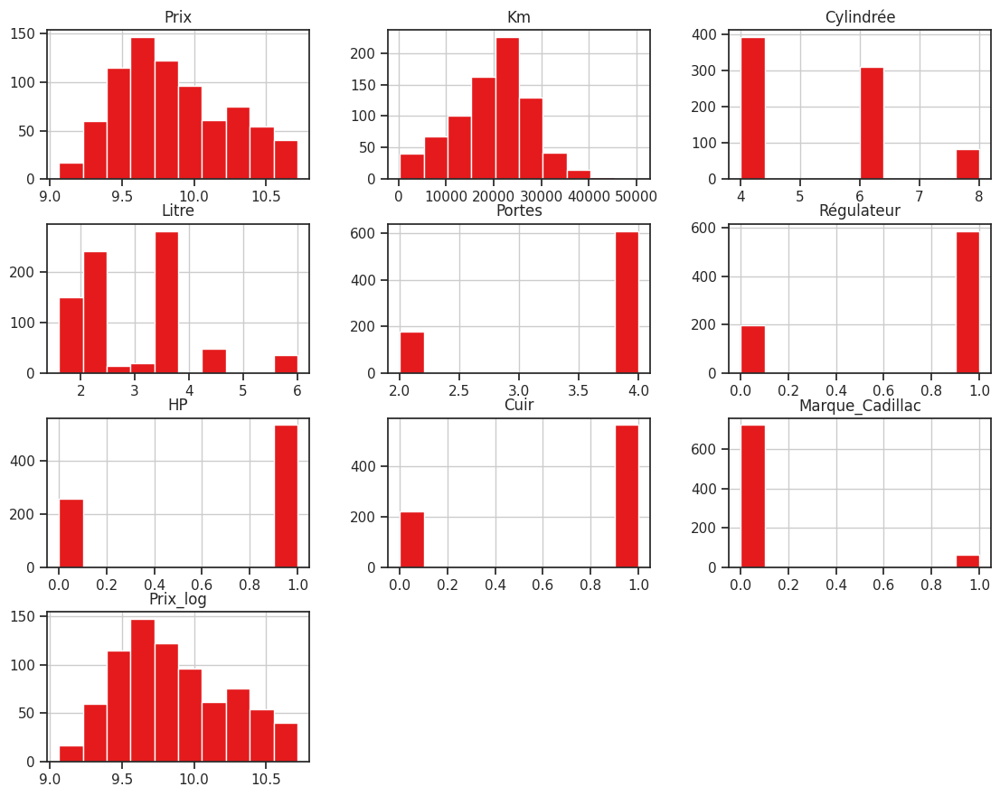

In [108]:
import matplotlib.pyplot as plt

# Tracer des histogrammes pour chaque variable
final_data_clean.hist(figsize=(12, 10))
plt.show()


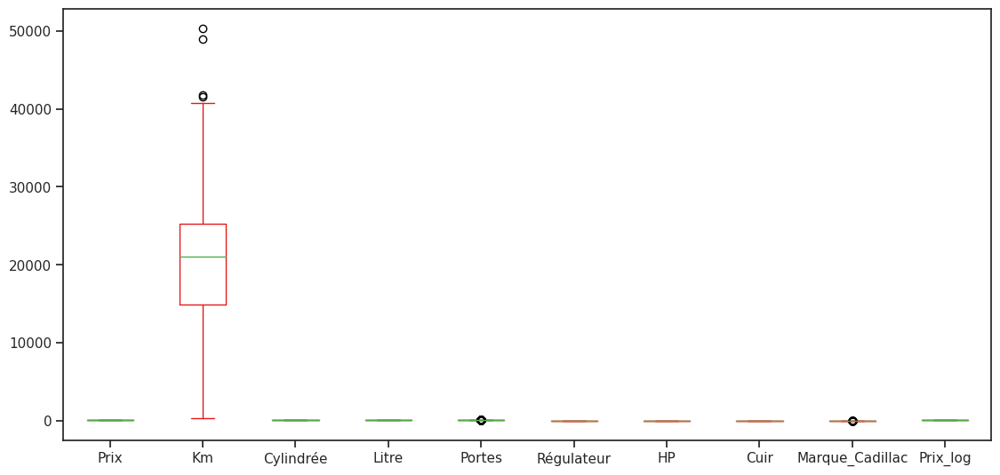

In [109]:
# Tracer des boxplots pour chaque variable
final_data_clean.plot.box(figsize=(12, 6))
plt.show()


In [111]:
X_centered = X - X.mean()
X_centered = sm.add_constant(X_centered)
model_centered = sm.OLS(y, X_centered).fit()
print(model_centered.summary())



                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     93.70
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           6.13e-99
Time:                        03:04:52   Log-Likelihood:                -120.28
No. Observations:                 787   AIC:                             256.6
Df Residuals:                     779   BIC:                             293.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.8562      0.010    975.748      0.0

In [115]:
import pandas as pd

# Calculer les quartiles et les whiskers
Q1 = final_data_clean['Km'].quantile(0.25)
Q3 = final_data_clean['Km'].quantile(0.75)
IQR = Q3 - Q1

# Définir les bornes pour les valeurs non aberrantes
borne_inf = Q1 - 1.5 * IQR
borne_sup = Q3 + 1.5 * IQR

# Filtrer les données pour supprimer les valeurs aberrantes
data_filtered = final_data_clean[(final_data_clean['Km'] >= borne_inf) & (final_data_clean['Km'] <= borne_sup)]


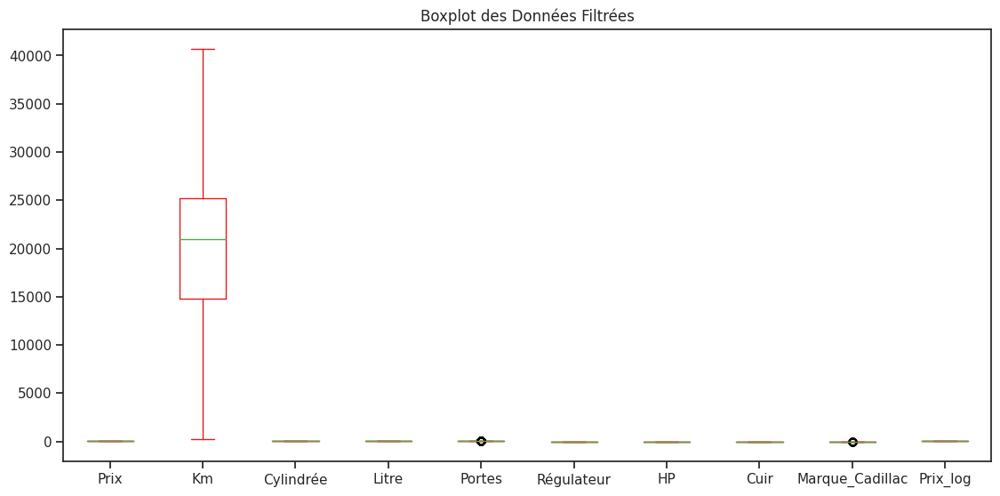

In [116]:
import matplotlib.pyplot as plt

# Tracer un boxplot pour vérifier les valeurs aberrantes
data_filtered.plot.box(figsize=(12, 6))
plt.title('Boxplot des Données Filtrées')
plt.show()


In [125]:
import statsmodels.api as sm

# Préparer les données
X_filtered = data_filtered[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y_filtered = data_filtered['Prix']

# Ajouter une constante au modèle
X_filtered = sm.add_constant(X_filtered)

# Ajuster le modèle OLS
model_filtered = sm.OLS(y_filtered, X_filtered).fit()

# Afficher le résumé du modèle
print(model_filtered.summary())



                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.461
Model:                            OLS   Adj. R-squared:                  0.456
Method:                 Least Squares   F-statistic:                     94.81
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           1.02e-99
Time:                        03:11:57   Log-Likelihood:                -116.86
No. Observations:                 783   AIC:                             249.7
Df Residuals:                     775   BIC:                             287.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.3265      0.073    127.389      0.0

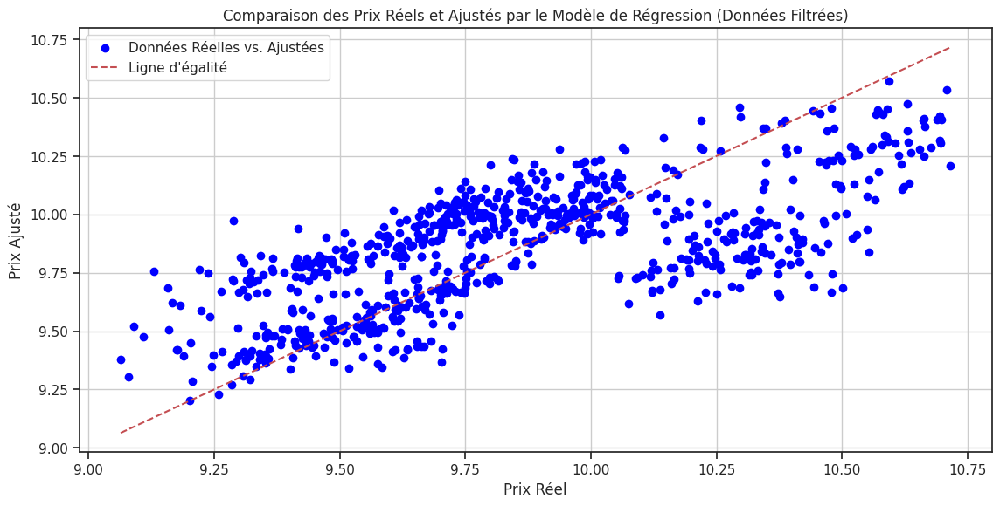

In [126]:
# Obtenir les valeurs ajustées
valeurs_ajustees_filtered = model_filtered.fittedvalues

# Création du graphique
plt.figure(figsize=(12, 6))

# Tracer les données réelles
plt.scatter(y_filtered, valeurs_ajustees_filtered, color='blue', label='Données Réelles vs. Ajustées')

# Tracer la ligne d'égalité (ligne diagonale où y = valeurs ajustées)
plt.plot([y_filtered.min(), y_filtered.max()], [y_filtered.min(), y_filtered.max()], 'r--', label='Ligne d\'égalité')

# Ajouter des labels et une légende
plt.xlabel('Prix Réel')
plt.ylabel('Prix Ajusté')
plt.title('Comparaison des Prix Réels et Ajustés par le Modèle de Régression (Données Filtrées)')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.447
Method:                 Least Squares   F-statistic:                     73.58
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           2.59e-77
Time:                        03:16:28   Log-Likelihood:                -99.382
No. Observations:                 629   AIC:                             214.8
Df Residuals:                     621   BIC:                             250.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.2963      0.082    113.831      0.0

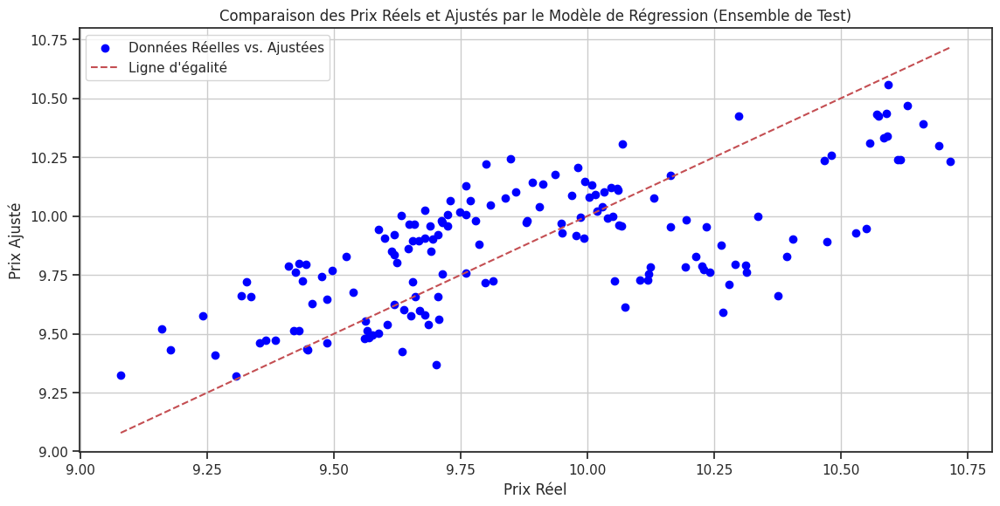

In [127]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Supposons que 'final_data_clean'

# Préparer les données
X = final_data_clean[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ajouter une constante au modèle (requis pour le calcul des VIFs, etc.)
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Ajuster le modèle OLS sur les données d'entraînement
model = sm.OLS(y_train, X_train).fit()

# Afficher le résumé du modèle
print(model.summary())

# Obtenir les valeurs ajustées pour l'ensemble de test
valeurs_ajustees_test = model.predict(X_test)

# Création du graphique pour les données de test
plt.figure(figsize=(12, 6))

# Tracer les données réelles vs ajustées pour l'ensemble de test
plt.scatter(y_test, valeurs_ajustees_test, color='blue', label='Données Réelles vs. Ajustées')

# Tracer la ligne d'égalité (ligne diagonale où y = valeurs ajustées)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ligne d\'égalité')

# Ajouter des labels et une légende
plt.xlabel('Prix Réel')
plt.ylabel('Prix Ajusté')
plt.title('Comparaison des Prix Réels et Ajustés par le Modèle de Régression (Ensemble de Test)')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.447
Method:                 Least Squares   F-statistic:                     73.58
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           2.59e-77
Time:                        03:17:58   Log-Likelihood:                -99.382
No. Observations:                 629   AIC:                             214.8
Df Residuals:                     621   BIC:                             250.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.2963      0.082    113.831      0.0

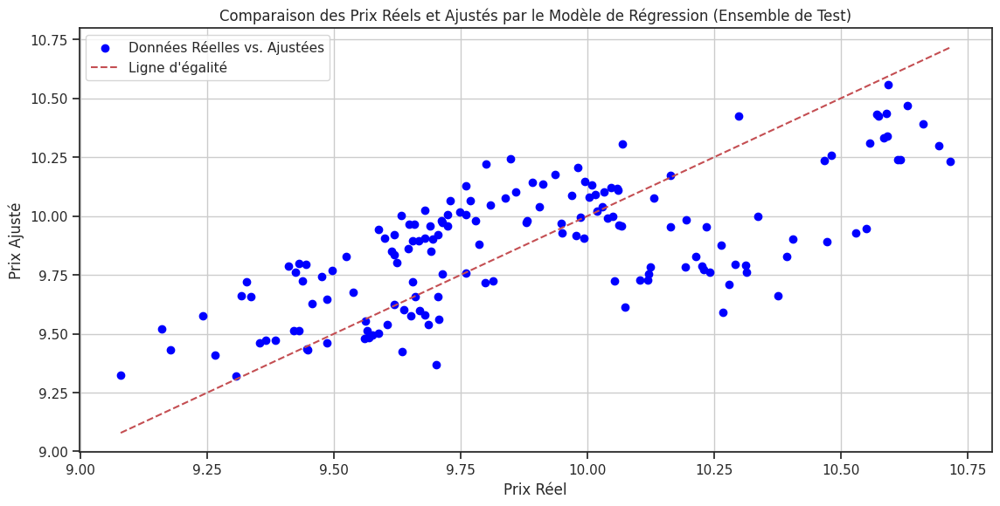

     Prix Réel  Prix Prévu
553  9.704498    9.920840 
39   9.947605    9.968670 
226  9.409836    9.788231 
214  9.176354    9.430128 
250  9.619395    9.919576 


In [128]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Supposons que 'final_data_clean'

# Préparer les données
X = final_data_clean[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ajouter une constante au modèle (nécessaire pour l'ajustement du modèle)
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Ajuster le modèle OLS sur les données d'entraînement
model = sm.OLS(y_train, X_train).fit()

# Afficher le résumé du modèle
print(model.summary())

# Faire des prévisions sur l'ensemble de test
valeurs_ajustees_test = model.predict(X_test)

# Création du graphique pour les données de test
plt.figure(figsize=(12, 6))

# Tracer les données réelles vs ajustées pour l'ensemble de test
plt.scatter(y_test, valeurs_ajustees_test, color='blue', label='Données Réelles vs. Ajustées')

# Tracer la ligne d'égalité (ligne diagonale où y = valeurs ajustées)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ligne d\'égalité')

# Ajouter des labels et une légende
plt.xlabel('Prix Réel')
plt.ylabel('Prix Ajusté')
plt.title('Comparaison des Prix Réels et Ajustés par le Modèle de Régression (Ensemble de Test)')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()

# Optionnel : Afficher quelques prévisions et les valeurs réelles associées
previsions_comparaison = pd.DataFrame({'Prix Réel': y_test, 'Prix Prévu': valeurs_ajustees_test})
print(previsions_comparaison.head())


Prévisions avec intervalles de confiance et de prévision:
    mean     mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  obs_ci_upper
0 -3.26052  3.006366   -9.164395       2.643355      -9.190903      2.669862  


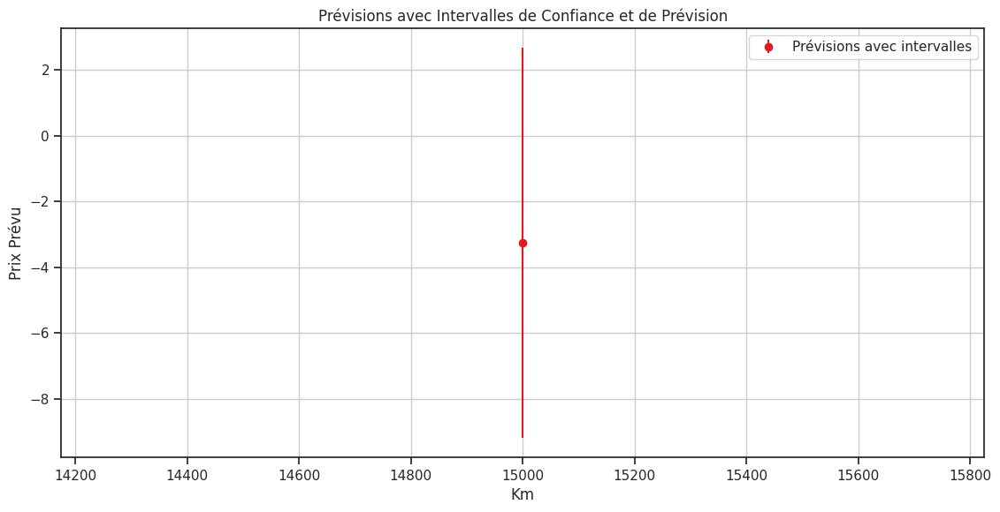

In [129]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Supposons que 'final_data_clean' est déjà défini et contient vos données

# Préparer les données
X = final_data_clean[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = final_data_clean['Prix']

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ajouter une constante au modèle (nécessaire pour l'ajustement du modèle)
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Ajuster le modèle OLS sur les données d'entraînement
model = sm.OLS(y_train, X_train).fit()

# Préparer les nouvelles données pour les prévisions
# Vous pouvez choisir les valeurs pour ces nouvelles données
nouvelles_valeurs = pd.DataFrame({
    'const': [1],  # La constante
    'Km': [15000],  # Exemple de valeur pour Km
    'Cylindrée': [2.5],  # Exemple de valeur pour Cylindrée
    'Litre': [3.0],  # Exemple de valeur pour Litre
    'Portes': [4],  # Exemple de valeur pour Portes
    'Régulateur': [1],  # Exemple de valeur pour Régulateur
    'HP': [120],  # Exemple de valeur pour HP
    'Cuir': [0]  # Exemple de valeur pour Cuir
})

# Faire des prévisions et obtenir les intervalles
previsions = model.get_prediction(nouvelles_valeurs)
summary_frame = previsions.summary_frame(alpha=0.05)  # Intervalle de confiance à 95%

# Afficher les résultats des prévisions
print("Prévisions avec intervalles de confiance et de prévision:")
print(summary_frame)

# Visualisation des résultats si vous souhaitez
# Vous pouvez tracer les intervalles de prévision sur un graphique si nécessaire
plt.figure(figsize=(12, 6))
plt.errorbar(nouvelles_valeurs['Km'], summary_frame['mean'],
             yerr=[summary_frame['mean'] - summary_frame['obs_ci_lower'],
                   summary_frame['obs_ci_upper'] - summary_frame['mean']],
             fmt='o', label='Prévisions avec intervalles')
plt.xlabel('Km')
plt.ylabel('Prix Prévu')
plt.title('Prévisions avec Intervalles de Confiance et de Prévision')
plt.legend()
plt.grid(True)
plt.show()


In [130]:
import pandas as pd

# Supposons que 'final_data_clean' est votre DataFrame

# Calculer la moyenne de chaque variable
moyenne = final_data_clean.mean()

# Centrer les données
donnees_centrees = final_data_clean - moyenne

# Optionnel : Normalisation (pour que les données aient une variance de 1)
ecart_type = final_data_clean.std()
donnees_normalisees = donnees_centrees / ecart_type

# Afficher les premières lignes des données centrées et normalisées
print("Données centrées :")
print(donnees_centrees.head())

print("Données normalisées :")
print(donnees_normalisees.head())


Données centrées :
     Prix         Km       Cylindrée    Litre    Portes   Régulateur  \
0 -0.096913 -11754.491741  0.790343   0.104193  0.452351   0.252859    
1 -0.083834 -10840.491741  0.790343   0.104193  0.452351   0.252859    
2 -0.162260  -6779.491741  0.790343   0.104193  0.452351   0.252859    
3 -0.155007  -3633.491741  0.790343   0.104193  0.452351   0.252859    
4 -0.154869   -143.491741  0.790343   0.104193  0.452351   0.252859    

      HP       Cuir    Marque_Cadillac  Marque_Chevrolet  Marque_Pontiac  \
0  0.324015  0.282084    -0.082592         -0.404066        -0.190597      
1  0.324015 -0.717916    -0.082592         -0.404066        -0.190597      
2  0.324015 -0.717916    -0.082592         -0.404066        -0.190597      
3 -0.675985 -0.717916    -0.082592         -0.404066        -0.190597      
4 -0.675985  0.282084    -0.082592         -0.404066        -0.190597      

   Marque_SAAB  Marque_Saturn  Modèle_9_3  Modèle_9_3 HO  Modèle_9_5  \
0  -0.144854     -0

                            OLS Regression Results                            
Dep. Variable:                   Prix   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.447
Method:                 Least Squares   F-statistic:                     73.58
Date:                Sun, 21 Jul 2024   Prob (F-statistic):           2.59e-77
Time:                        03:34:09   Log-Likelihood:                -703.26
No. Observations:                 629   AIC:                             1423.
Df Residuals:                     621   BIC:                             1458.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0026      0.030     -0.087      0.9

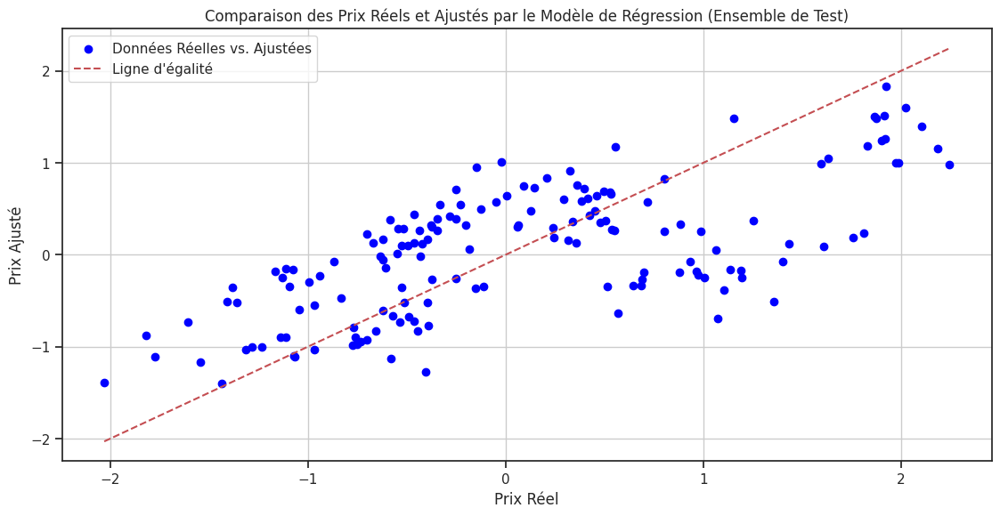

In [131]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Supposons que 'final_data_clean'

# Préparer les données
X = donnees_normalisees[['Km', 'Cylindrée', 'Litre', 'Portes', 'Régulateur', 'HP', 'Cuir']]
y = donnees_normalisees['Prix']

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ajouter une constante au modèle (requis pour le calcul des VIFs, etc.)
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Ajuster le modèle OLS sur les données d'entraînement
model = sm.OLS(y_train, X_train).fit()

# Afficher le résumé du modèle
print(model.summary())

# Obtenir les valeurs ajustées pour l'ensemble de test
valeurs_ajustees_test = model.predict(X_test)

# Création du graphique pour les données de test
plt.figure(figsize=(12, 6))

# Tracer les données réelles vs ajustées pour l'ensemble de test
plt.scatter(y_test, valeurs_ajustees_test, color='blue', label='Données Réelles vs. Ajustées')

# Tracer la ligne d'égalité (ligne diagonale où y = valeurs ajustées)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ligne d\'égalité')

# Ajouter des labels et une légende
plt.xlabel('Prix Réel')
plt.ylabel('Prix Ajusté')
plt.title('Comparaison des Prix Réels et Ajustés par le Modèle de Régression (Ensemble de Test)')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()
